# Predictive analytics. Electric energy consumption forecasting

ver. 1.0

1. [Data preparation](#1)  
    * [Energy Russia](#1.1)  
    * [Average temperature in Russia](#1.2)  
    * [Energy in the region of NORTH-WEST United Energy System](#1.11)  
    * [Temperature in the region of NORTH-WEST United Energy System](#1.12)  
    * [Weather in Saint Petersburg](#1.3)
    * [Temperature in Arkhangelsk, Kaliningrad, Pskov, Murmansk](#1.10)
    * [USD to RUB Exchange Rate](#1.4)  
    * [Population](#1.5)  
    * [Gas](#1.6)  
    * [Oil](#1.7)  
    * [Coal](#1.8)  
    * [Current frequency](#1.9)    
    
        
2. [Energy balance analysis (decomposition)](#2)  
3. [Dataset Creation](#3)
    * [Setting Dataset for Analysis](#3.1)
    * [Setting Dataset for Model](#3.2)
    
    
4. [Modelling](#4)  
    * [Preprocessing](#4.1)  
    * [Linear Regression](#4.2)  
    * [Decision Tree](#4.3)  
    * [Random Forest](#4.4)  
    * [CatBoost from Yandex](#4.5)  
    * [MLP Regressor](#4.6)   
    
    
* [Forecasting for 3 days ahead via Random Forest](#4.7)   
* [Forecasting for a week ahead via Random Forest](#4.8)   
* [Forecasting for a month ahead via Random Forest](#4.9)   
    
    
5. [Roadmap](#5)  

Let's import libraries and create some helper functions to use further.

In [209]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.notebook import trange, tqdm

from sklearn.model_selection import train_test_split, TimeSeriesSplit, RandomizedSearchCV, GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, make_scorer

from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from catboost import CatBoostRegressor

In [210]:
#pd.set_option('display.max_rows', 10)
#pd.options.display.float_format = '{:.2f}'.format

In [211]:
def set_graph_params():
    parameters = {'axes.labelsize': 25,
                  'axes.titlesize': 25,
                  'xtick.labelsize': 25,
                  'ytick.labelsize': 25}
    plt.rcParams.update(parameters)

In [212]:
def interpolation(data):
    #https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.interpolate.html
    print(f'{data.isna().sum().sum()} missing entries, interpolating...')
    data.interpolate(method='time', inplace=True)
    print(f'interpolating done, {data.isna().sum().sum()} missing entries left')

In [213]:
def print_info(data):
    display(data, data.info(), data.describe())

In [214]:
def evaluate_model(preds, true):
    plt.subplots(figsize=(10, 5))
    pd.Series(preds).iloc[:30].plot()
    pd.Series(true).reset_index(drop=True).iloc[:30].plot()
    plt.ylabel('Consumption')
    plt.legend(['Preds', 'True'])
    
    set_graph_params()
    plt.subplots(figsize=(40, 20))
    ax = plt.subplot(2, 1, 1)
    pd.Series(preds).plot(ax = ax)
    plt.ylabel('Consumption')
    plt.title('preds')
    ax = plt.subplot(2, 1, 2)
    pd.Series(true).reset_index(drop=True).plot(ax = ax)
    plt.ylabel('Consumption')
    plt.title('true')
    plt.rcParams.update(plt.rcParamsDefault)
    
    plt.subplots(figsize=(10, 5))
    ax = plt.subplot(1, 2, 1)
    sns.distplot(pd.Series(preds), ax = ax)
    plt.title('preds')
    ax = plt.subplot(1, 2, 2)
    sns.distplot(pd.Series(true).reset_index(drop=True), ax = ax)
    plt.title('true')

In [215]:
def train_best_model(model, train_features, train_target, test_features, test_target):
    model.fit(train_features, train_target)
    train_preds = model.predict(train_features)
    test_preds = model.predict(test_features)
    
    print('RMSE on train : {:.2f}\nMAPE on train : {:.2f}'.format(mean_squared_error(train_target, train_preds, 
                                                squared=False),mean_absolute_percentage_error(train_target, train_preds)))

    print('RMSE on test : {:.2f}\nMAPE on test : {:.2f}'.format(mean_squared_error(test_target, test_preds, 
                                                squared=False), mean_absolute_percentage_error(test_target, test_preds)))
    return test_preds

In [216]:
def save_dataset(data, for_ml=True):
    if not for_ml:
        dataset = data.copy(deep=True)
        dataset['day_of_week'] = dataset.index.dayofweek
        dataset.to_csv('dataset.csv')
    else:
        data.to_csv('dataset_ml.csv')

In [217]:
def plot_energy_graph(energy):
    set_graph_params()
    
    plt.figure(figsize=(50, 25))
    plt.plot(energy)
    plt.xlabel('Date')
    plt.title('Energy balance')
    plt.tick_params(axis='x')
    plt.tick_params(axis='y')
    plt.legend(energy.columns, prop={'size': 25})
    plt.show()
    
    plt.rcParams.update(plt.rcParamsDefault)

# 1. Data preparation<a id="1"></a>
## Energy Russia<a id="1.1"></a>

In [218]:
energy = pd.read_csv('datasets/out_gen_consume.csv', sep=';', index_col=[0], parse_dates=[0])

In [219]:
energy.columns = ['generation_UES', 'consumption_UES']
energy

,generation_UES,consumption_UES
date,,
2000-01-01,1714188,1685503
2000-01-02,1676017,1646886
2000-01-03,1821309,1786437
2000-01-04,1831355,1792719
2000-01-05,1829575,1796560
...,...,...
2020-11-17,3205982,3172629
2020-11-18,3241331,3201471
2020-11-19,3238289,3195763


In [220]:
energy.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 7606 entries, 2000-01-01 to 2020-11-21
Data columns (total 2 columns):
 #   Column           Non-Null Count  Dtype
---  ------           --------------  -----
 0   generation_UES   7606 non-null   int64
 1   consumption_UES  7606 non-null   int64
dtypes: int64(2)
memory usage: 178.3 KB


In [221]:
energy.index.is_monotonic

True

In [222]:
date_index = pd.date_range(start='2000-01-01', end='2020-11-21')
date_index

DatetimeIndex(['2000-01-01', '2000-01-02', '2000-01-03', '2000-01-04',
               '2000-01-05', '2000-01-06', '2000-01-07', '2000-01-08',
               '2000-01-09', '2000-01-10',
               ...
               '2020-11-12', '2020-11-13', '2020-11-14', '2020-11-15',
               '2020-11-16', '2020-11-17', '2020-11-18', '2020-11-19',
               '2020-11-20', '2020-11-21'],
              dtype='datetime64[ns]', length=7631, freq='D')

In [223]:
energy = energy.reindex(date_index)
energy

,generation_UES,consumption_UES
2000-01-01,1714188.0,1685503.0
2000-01-02,1676017.0,1646886.0
2000-01-03,1821309.0,1786437.0
2000-01-04,1831355.0,1792719.0
2000-01-05,1829575.0,1796560.0
...,...,...
2020-11-17,3205982.0,3172629.0
2020-11-18,3241331.0,3201471.0
2020-11-19,3238289.0,3195763.0
2020-11-20,3224532.0,3191706.0


In [224]:
energy.index.is_monotonic

True

In [225]:
energy.isna().sum()

generation_UES     25
consumption_UES    25
dtype: int64

In [226]:
energy[energy['generation_UES'].isna()]

,generation_UES,consumption_UES
2000-10-01,NaN,NaN
2000-10-02,NaN,NaN
2000-10-03,NaN,NaN
2000-10-04,NaN,NaN
2000-10-05,NaN,NaN
2000-10-06,NaN,NaN
2000-10-07,NaN,NaN
2000-10-08,NaN,NaN
2000-10-09,NaN,NaN
2000-10-10,NaN,NaN


In [227]:
interpolation(energy)

50 missing entries, interpolating...
interpolating done, 0 missing entries left


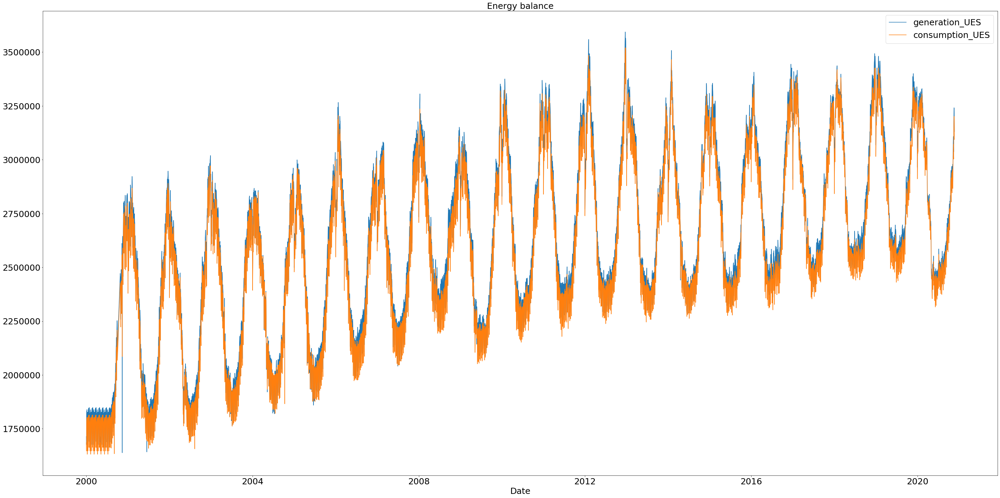

In [228]:
plot_energy_graph(energy)

Text(0.5, 1.0, 'week')

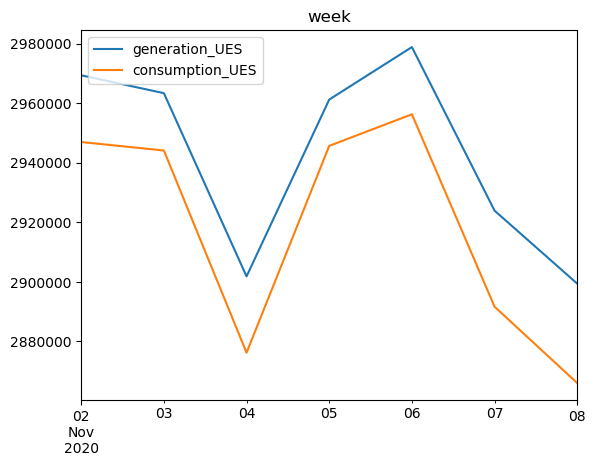

In [229]:
energy['2020-11-02':'2020-11-08'].plot()
plt.title('week')

Text(0.5, 1.0, 'month')

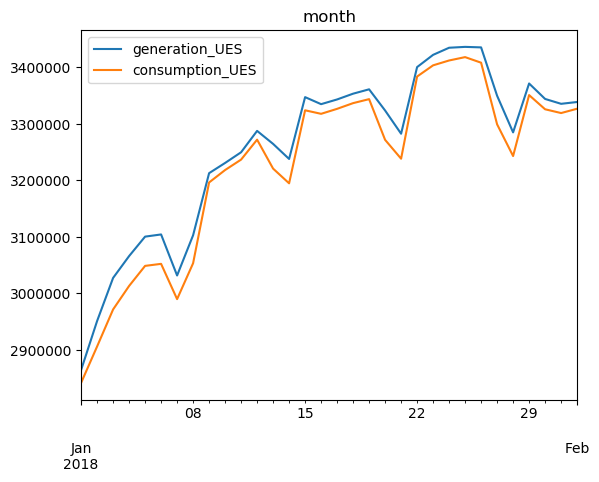

In [230]:
energy['2018-01-01':'2018-02-01'].plot()
plt.title('month')

Text(0.5, 1.0, 'half year')

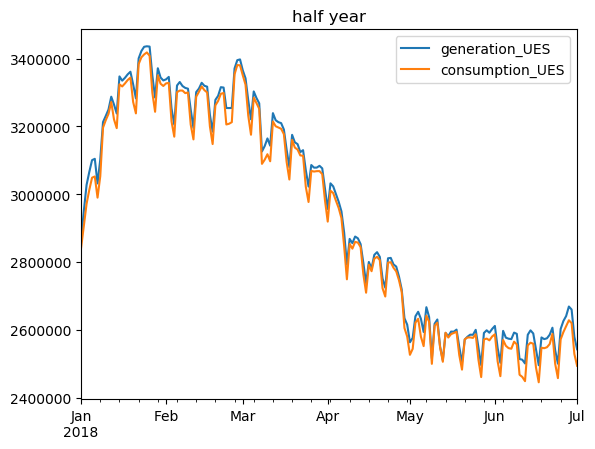

In [231]:
energy['2018-01-01':'2018-07-01'].plot()
plt.title('half year')

Text(0.5, 1.0, 'year')

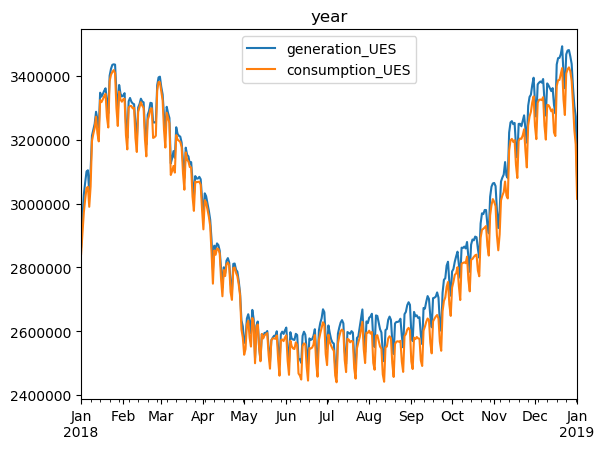

In [232]:
energy['2018-01-01':'2019-01-01'].plot()
plt.title('year')

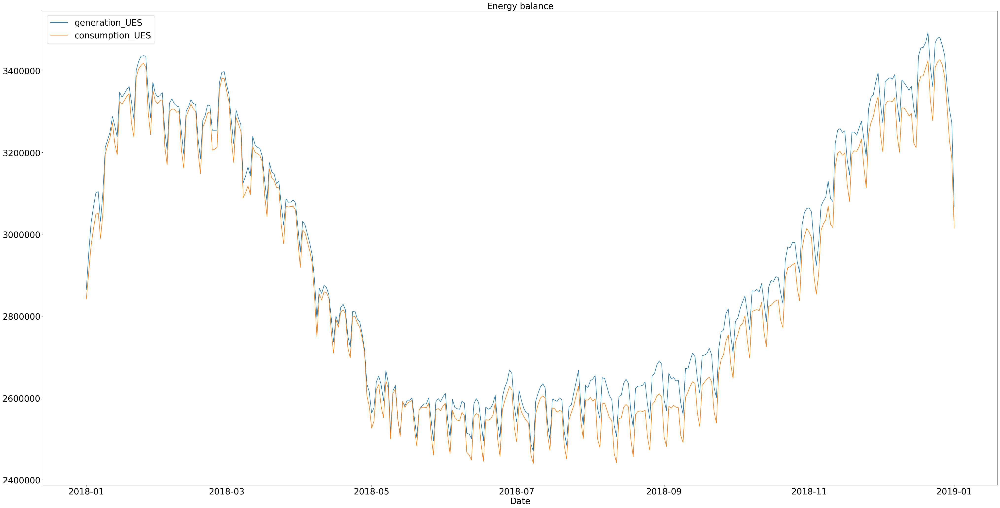

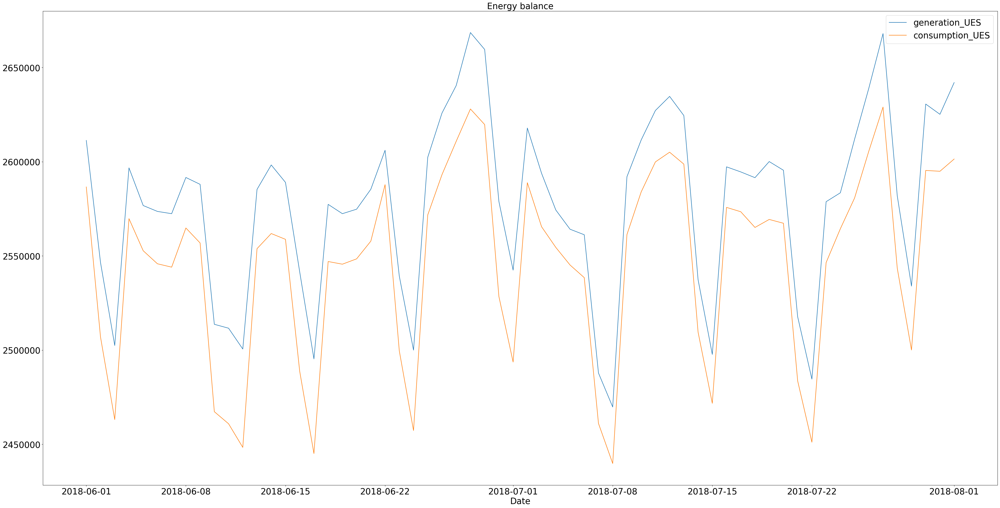

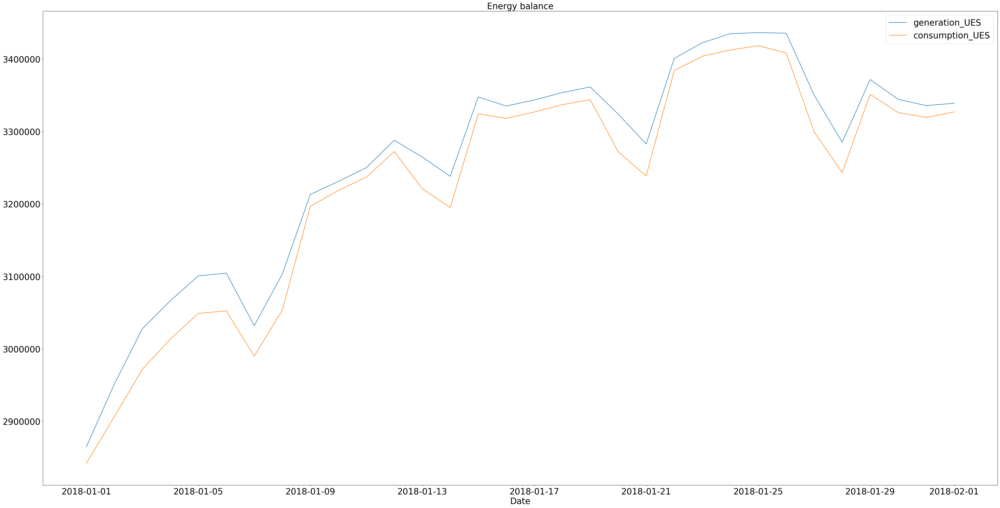

In [233]:
plot_energy_graph(energy['2018-01-01':'2019-01-01'])
plot_energy_graph(energy['2018-06-01':'2018-08-01'])
plot_energy_graph(energy['2018-01-01':'2018-02-01'])

In [234]:
print_info(energy)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 7631 entries, 2000-01-01 to 2020-11-21
Freq: D
Data columns (total 2 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   generation_UES   7631 non-null   float64
 1   consumption_UES  7631 non-null   float64
dtypes: float64(2)
memory usage: 498.9 KB


,generation_UES,consumption_UES
2000-01-01,1714188.0,1685503.0
2000-01-02,1676017.0,1646886.0
2000-01-03,1821309.0,1786437.0
2000-01-04,1831355.0,1792719.0
2000-01-05,1829575.0,1796560.0
...,...,...
2020-11-17,3205982.0,3172629.0
2020-11-18,3241331.0,3201471.0
2020-11-19,3238289.0,3195763.0
2020-11-20,3224532.0,3191706.0


None

,generation_UES,consumption_UES
count,7.631000e+03,7.631000e+03
mean,2.629716e+06,2.589703e+06
std,4.122901e+05,4.060853e+05
min,1.638535e+06,1.631657e+06
25%,2.374906e+06,2.342382e+06
50%,2.614705e+06,2.576413e+06
75%,2.938928e+06,2.895698e+06
max,3.593181e+06,3.519601e+06


## Average temperature in Russia<a id="1.2"></a>

In [235]:
temp = pd.read_csv('datasets/температура_ЕЭС.csv', sep=';', index_col=[0], parse_dates=[0])
temp.rename(columns={'8.39': 'temp_UES'}, inplace=True)
temp.index.rename('date', inplace=True)
temp = temp['2003-10-13':]
temp

,temp_UES
date,
2003-10-13,7.21
2003-10-14,7.35
2003-10-15,6.42
2003-10-16,5.67
2003-10-17,5.43
...,...
2020-11-21,-3.36
2020-11-22,-4.26
2020-11-23,-3.86


In [236]:
temp.index.is_monotonic

False

In [237]:
date_index = pd.date_range(start='2003-10-13', end='2020-11-25')
date_index

DatetimeIndex(['2003-10-13', '2003-10-14', '2003-10-15', '2003-10-16',
               '2003-10-17', '2003-10-18', '2003-10-19', '2003-10-20',
               '2003-10-21', '2003-10-22',
               ...
               '2020-11-16', '2020-11-17', '2020-11-18', '2020-11-19',
               '2020-11-20', '2020-11-21', '2020-11-22', '2020-11-23',
               '2020-11-24', '2020-11-25'],
              dtype='datetime64[ns]', length=6254, freq='D')

In [238]:
temp = temp.reindex(date_index)
temp.isna().sum()

temp_UES    490
dtype: int64

In [239]:
temp.loc[temp['temp_UES'].isna()]

,temp_UES
2003-11-01,NaN
2003-11-02,NaN
2003-11-03,NaN
2003-11-04,NaN
2003-11-05,NaN
...,...
2020-07-12,NaN
2020-08-12,NaN
2020-09-12,NaN
2020-10-12,NaN


In [240]:
temp.loc['2007-03-03':'2007-06-05', 'temp_UES'] = temp.loc['2008-03-03':'2008-06-05', 'temp_UES'].values - 0.5
temp.loc['2004-10-11':'2005-12-09', 'temp_UES'] = temp.loc['2006-10-11':'2007-12-09', 'temp_UES'].values - 1
temp.loc['2003-12-01':'2003-12-09', 'temp_UES'] = temp.loc['2004-12-01':'2004-12-09', 'temp_UES'].values - 0.5

In [241]:
interpolation(temp)

91 missing entries, interpolating...
interpolating done, 0 missing entries left


In [242]:
print_info(temp)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 6254 entries, 2003-10-13 to 2020-11-25
Freq: D
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   temp_UES  6254 non-null   float64
dtypes: float64(1)
memory usage: 257.7 KB


,temp_UES
2003-10-13,7.21
2003-10-14,7.35
2003-10-15,6.42
2003-10-16,5.67
2003-10-17,5.43
...,...
2020-11-21,-3.36
2020-11-22,-4.26
2020-11-23,-3.86
2020-11-24,-3.15


None

,temp_UES
count,6254.000000
mean,4.535183
std,11.524700
min,-26.760000
25%,-5.227500
50%,5.180000
75%,15.160000
max,25.110000


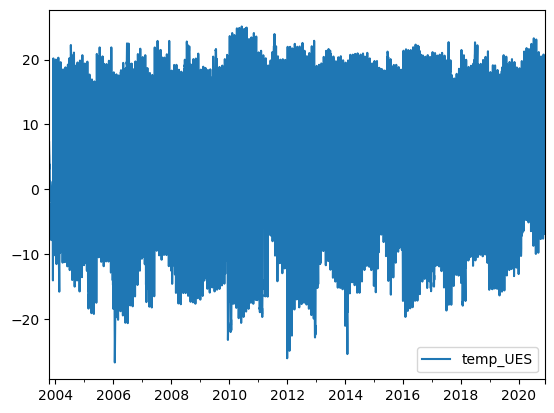

In [243]:
temp.plot()

## Energy in the region of NORTH-WEST United Energy System<a id="1.11"></a>

In [244]:
energynw = pd.read_csv('datasets/gen_consume_day_nw.csv', sep=';', index_col=[0], parse_dates=[0])
energynw.index.names = ['date']
energynw.columns = ['generation_NW_UES', 'consumption_NW_UES']
energynw

,generation_NW_UES,consumption_NW_UES
date,,
2000-01-01,147784,145101
2000-01-02,148883,143112
2000-01-03,162189,157895
2000-01-04,161764,155811
2000-01-05,165393,156634
...,...,...
2020-11-20,298231,273451
2020-11-21,283850,269451
2020-11-22,290666,268178


In [245]:
energynw.loc['2018-07-01':'2018-08-01']

,generation_NW_UES,consumption_NW_UES
date,,
2018-07-01,286363,215575
2018-07-02,275569,224582
2018-07-03,268377,221663
2018-07-04,264769,218465
2018-07-05,266618,218959
2018-07-06,263936,220813
2018-07-07,269214,213371
2018-07-08,269144,208411
2018-07-09,269360,218553


In [246]:
date_index = pd.date_range(start='2000-01-01', end='2020-11-21')
date_index

DatetimeIndex(['2000-01-01', '2000-01-02', '2000-01-03', '2000-01-04',
               '2000-01-05', '2000-01-06', '2000-01-07', '2000-01-08',
               '2000-01-09', '2000-01-10',
               ...
               '2020-11-12', '2020-11-13', '2020-11-14', '2020-11-15',
               '2020-11-16', '2020-11-17', '2020-11-18', '2020-11-19',
               '2020-11-20', '2020-11-21'],
              dtype='datetime64[ns]', length=7631, freq='D')

In [247]:
energynw = energynw.reindex(date_index)
energynw

,generation_NW_UES,consumption_NW_UES
2000-01-01,147784.0,145101.0
2000-01-02,148883.0,143112.0
2000-01-03,162189.0,157895.0
2000-01-04,161764.0,155811.0
2000-01-05,165393.0,156634.0
...,...,...
2020-11-17,303823.0,276584.0
2020-11-18,297406.0,278124.0
2020-11-19,295603.0,270992.0
2020-11-20,298231.0,273451.0


In [248]:
interpolation(energynw)

50 missing entries, interpolating...
interpolating done, 0 missing entries left


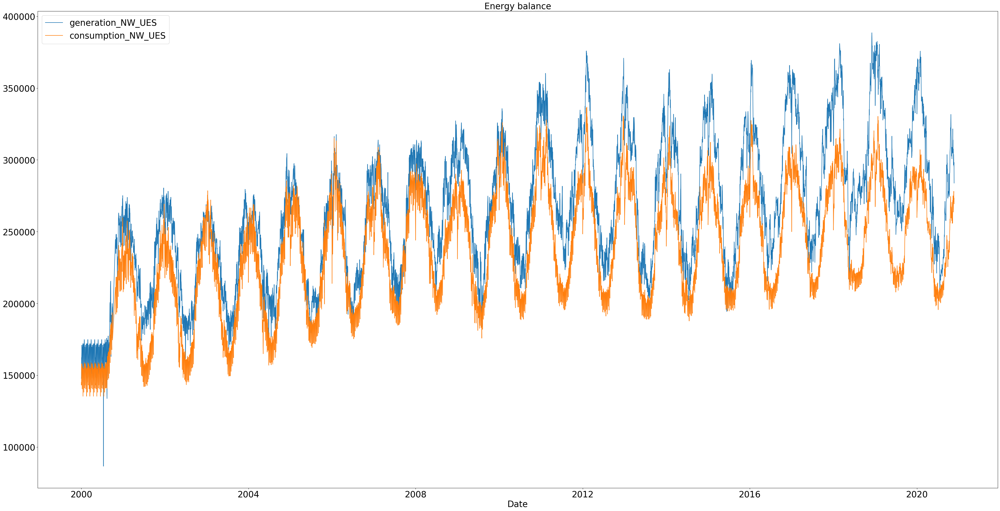

In [249]:
plot_energy_graph(energynw)

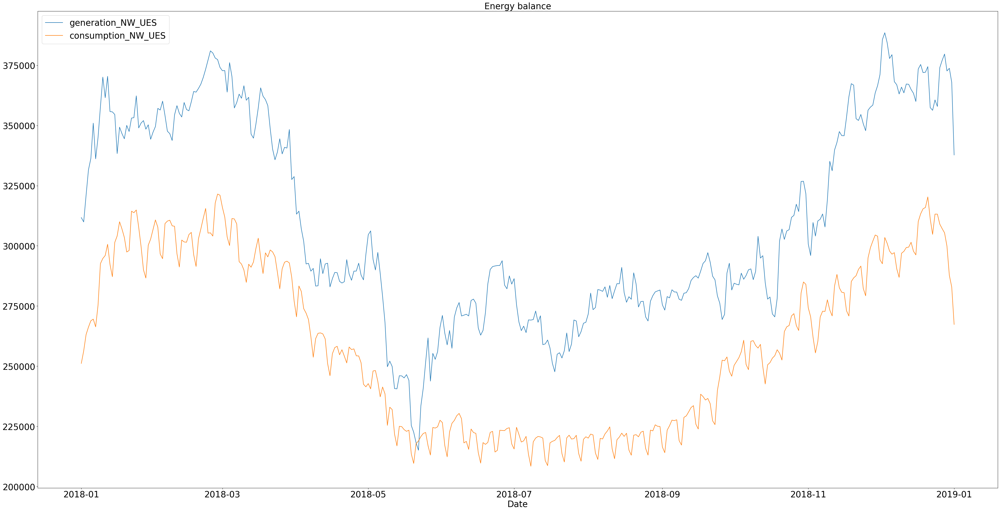

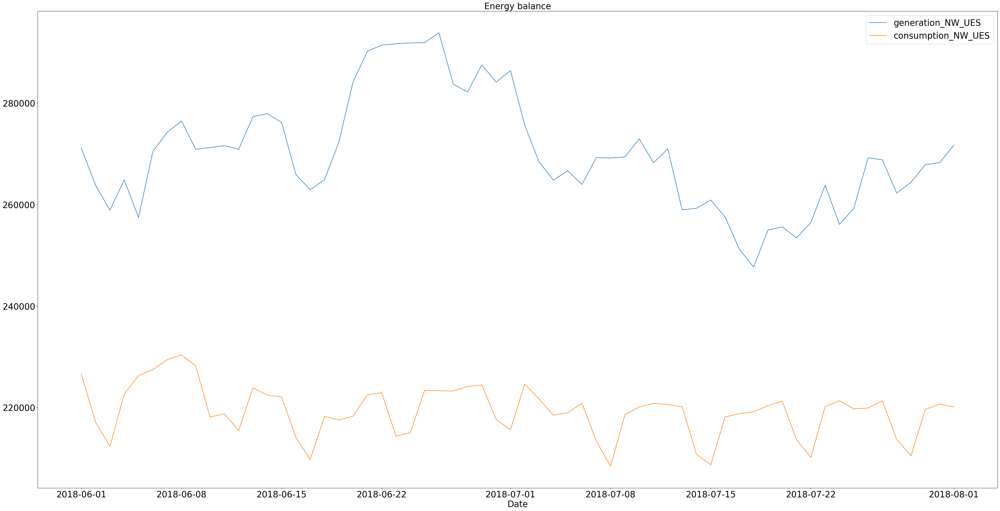

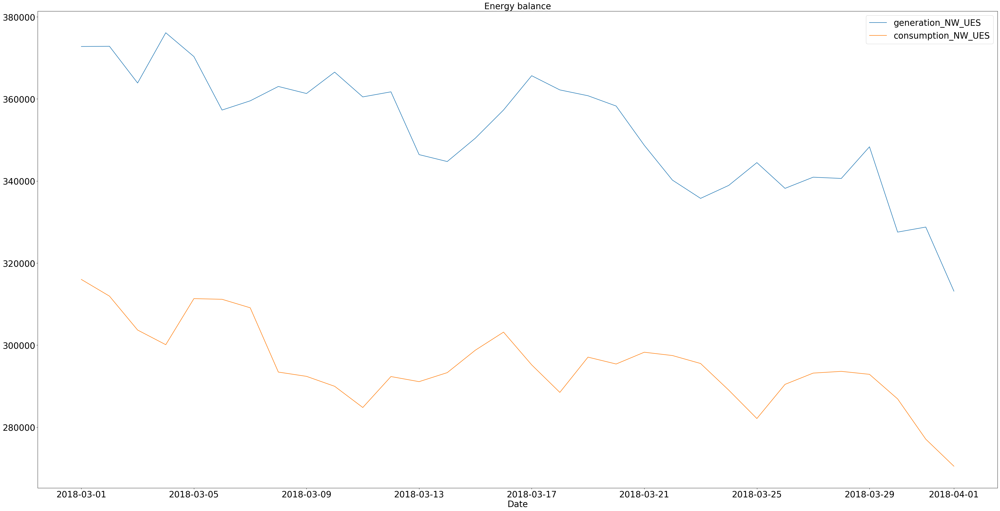

In [250]:
plot_energy_graph(energynw['2018-01-01':'2019-01-01'])
plot_energy_graph(energynw['2018-06-01':'2018-08-01'])
plot_energy_graph(energynw['2018-03-01':'2018-04-01'])

In [251]:
print_info(energynw)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 7631 entries, 2000-01-01 to 2020-11-21
Freq: D
Data columns (total 2 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   generation_NW_UES   7631 non-null   float64
 1   consumption_NW_UES  7631 non-null   float64
dtypes: float64(2)
memory usage: 498.9 KB


,generation_NW_UES,consumption_NW_UES
2000-01-01,147784.0,145101.0
2000-01-02,148883.0,143112.0
2000-01-03,162189.0,157895.0
2000-01-04,161764.0,155811.0
2000-01-05,165393.0,156634.0
...,...,...
2020-11-17,303823.0,276584.0
2020-11-18,297406.0,278124.0
2020-11-19,295603.0,270992.0
2020-11-20,298231.0,273451.0


None

,generation_NW_UES,consumption_NW_UES
count,7631.000000,7631.000000
mean,265396.238697,236550.211899
std,48252.034231,40882.010035
min,86622.000000,135364.000000
25%,231221.500000,208422.500000
50%,263906.000000,236026.000000
75%,300744.500000,269535.000000
max,388549.000000,336811.000000


## Temperature in the region of NORTH-WEST United Energy System<a id="1.12"></a>

In [252]:
temp_nw = pd.read_csv('datasets/temperature_nw.csv', sep=';', index_col=[0], parse_dates=[0], encoding='latin1')
temp_nw.index.names = ['date']
temp_nw.columns = ['temp_NW']
#index = pd.to_datetime(temp_nw.index, unit='s').strftime('%Y-%M-%D %H:%M:%S')
#index = pd.to_datetime(temp_nw.index, dayfirst=True)
#temp_nw.index = index
temp_nw = temp_nw.loc['2003-10-13':]
temp_nw

,temp_NW
date,
2003-10-13,8.30
2003-10-14,7.70
2003-10-15,5.00
2003-10-16,4.50
2003-10-17,4.70
...,...
2020-11-21,-0.18
2020-11-22,1.18
2020-11-23,2.24


In [253]:
date_index = pd.date_range(start='2003-10-13', end='2020-11-25')
temp_nw = temp_nw.reindex(date_index)
temp_nw

,temp_NW
2003-10-13,8.30
2003-10-14,7.70
2003-10-15,5.00
2003-10-16,4.50
2003-10-17,4.70
...,...
2020-11-21,-0.18
2020-11-22,1.18
2020-11-23,2.24
2020-11-24,0.80


In [254]:
temp_nw.isna().sum()
#display(temp_nw[temp_nw['temperature'].isna()])

temp_NW    490
dtype: int64

In [255]:
interpolation(temp_nw)

490 missing entries, interpolating...
interpolating done, 0 missing entries left


In [256]:
temp_nw = temp_nw['2006-01-01':]

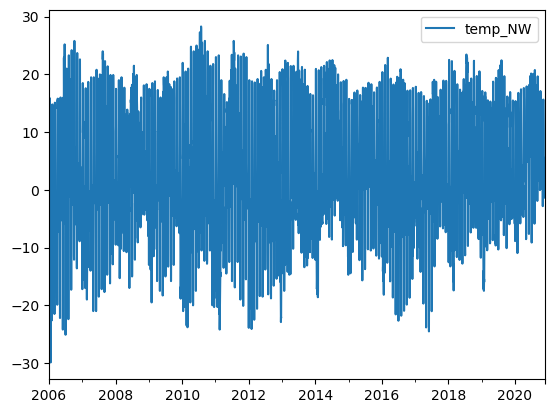

In [257]:
temp_nw.plot()

In [258]:
print_info(temp_nw)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5443 entries, 2006-01-01 to 2020-11-25
Freq: D
Data columns (total 1 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   temp_NW  5443 non-null   float64
dtypes: float64(1)
memory usage: 85.0 KB


,temp_NW
2006-01-01,-1.50
2006-01-02,-22.10
2006-01-03,-13.50
2006-01-04,3.10
2006-01-05,7.30
...,...
2020-11-21,-0.18
2020-11-22,1.18
2020-11-23,2.24
2020-11-24,0.80


None

,temp_NW
count,5443.000000
mean,4.474731
std,9.904690
min,-29.900000
25%,-2.300000
50%,4.150000
75%,12.855000
max,28.300000


## Weather in Saint Petersburg<a id="1.3"></a>

In [259]:
weather = pd.read_csv('datasets/weather.csv', sep=',', index_col=[1], parse_dates=[1])

In [260]:
weather = weather[::-1] #invertion of time, just like in Nolan`s Tenet:)
weather

,id,T,Po,P,Pa,U,Ff,N,VV,Td
Местное время в Санкт-Петербурге,,,,,,,,,,
2005-01-02 03:00:00,45961,-8.8,749.4,750.0,0.0,83.0,4.0,100,4.0,-11.2
2005-01-02 06:00:00,45960,-9.6,750.4,751.0,0.0,75.0,3.0,100,10.0,-13.2
2005-01-02 09:00:00,45959,-9.4,751.5,752.1,0.0,76.0,3.0,100,10.0,-12.9
2005-01-02 12:00:00,45958,-8.8,752.6,753.2,0.0,76.0,3.0,100,10.0,-12.2
2005-01-02 15:00:00,45957,-7.5,753.5,754.1,0.0,76.0,3.0,100,10.0,-11.0
...,...,...,...,...,...,...,...,...,...,...
2020-11-19 09:00:00,4,10.3,750.2,750.6,-1.9,86.0,5.0,100,10.0,8.1
2020-11-19 12:00:00,3,10.3,748.0,748.4,-2.2,78.0,6.0,100,10.0,6.6
2020-11-19 15:00:00,2,10.4,746.0,746.4,-2.0,78.0,6.0,100,10.0,6.6


In [261]:
weather = weather.loc[:, ['T', 'P', 'U', 'Ff', 'N']]
weather

,T,P,U,Ff,N
Местное время в Санкт-Петербурге,,,,,
2005-01-02 03:00:00,-8.8,750.0,83.0,4.0,100
2005-01-02 06:00:00,-9.6,751.0,75.0,3.0,100
2005-01-02 09:00:00,-9.4,752.1,76.0,3.0,100
2005-01-02 12:00:00,-8.8,753.2,76.0,3.0,100
2005-01-02 15:00:00,-7.5,754.1,76.0,3.0,100
...,...,...,...,...,...
2020-11-19 09:00:00,10.3,750.6,86.0,5.0,100
2020-11-19 12:00:00,10.3,748.4,78.0,6.0,100
2020-11-19 15:00:00,10.4,746.4,78.0,6.0,100


In [262]:
weather.index.rename('date', inplace=True)
weather.rename(columns={'T': 'temp_SPB', 'P': 'pressure_SPB', 'U': 'humidity_SPB', 'Ff': 'wind_speed_SPB', 'N': 'cloudiness_SPB'}, inplace=True)
weather

,temp_SPB,pressure_SPB,humidity_SPB,wind_speed_SPB,cloudiness_SPB
date,,,,,
2005-01-02 03:00:00,-8.8,750.0,83.0,4.0,100
2005-01-02 06:00:00,-9.6,751.0,75.0,3.0,100
2005-01-02 09:00:00,-9.4,752.1,76.0,3.0,100
2005-01-02 12:00:00,-8.8,753.2,76.0,3.0,100
2005-01-02 15:00:00,-7.5,754.1,76.0,3.0,100
...,...,...,...,...,...
2020-11-19 09:00:00,10.3,750.6,86.0,5.0,100
2020-11-19 12:00:00,10.3,748.4,78.0,6.0,100
2020-11-19 15:00:00,10.4,746.4,78.0,6.0,100


In [263]:
weather.index.is_monotonic

False

In [264]:
date_index = pd.date_range(start='2005-01-02 03:00:00', end='2020-11-19 21:00:00', freq='3H')
date_index

DatetimeIndex(['2005-01-02 03:00:00', '2005-01-02 06:00:00',
               '2005-01-02 09:00:00', '2005-01-02 12:00:00',
               '2005-01-02 15:00:00', '2005-01-02 18:00:00',
               '2005-01-02 21:00:00', '2005-01-03 00:00:00',
               '2005-01-03 03:00:00', '2005-01-03 06:00:00',
               ...
               '2020-11-18 18:00:00', '2020-11-18 21:00:00',
               '2020-11-19 00:00:00', '2020-11-19 03:00:00',
               '2020-11-19 06:00:00', '2020-11-19 09:00:00',
               '2020-11-19 12:00:00', '2020-11-19 15:00:00',
               '2020-11-19 18:00:00', '2020-11-19 21:00:00'],
              dtype='datetime64[ns]', length=46407, freq='3H')

In [265]:
weather = weather.reindex(date_index)
weather.isna().sum()

temp_SPB          533
pressure_SPB      533
humidity_SPB      533
wind_speed_SPB    533
cloudiness_SPB    533
dtype: int64

In [266]:
interpolation(weather)

2665 missing entries, interpolating...
interpolating done, 0 missing entries left


In [267]:
weather = weather.resample('1D').mean() #resampling to days
weather

,temp_SPB,pressure_SPB,humidity_SPB,wind_speed_SPB,cloudiness_SPB
2005-01-02,-8.457143,753.471429,76.428571,3.000,100.000
2005-01-03,-12.887500,750.987500,71.250000,3.500,93.750
2005-01-04,1.437500,770.875000,77.875000,1.125,37.500
2005-01-05,3.337500,760.875000,90.000000,1.625,100.000
2005-01-06,10.362500,752.125000,85.125000,1.375,99.375
...,...,...,...,...,...
2020-11-15,0.787500,770.137500,79.250000,1.375,95.625
2020-11-16,1.450000,769.125000,80.500000,1.500,87.500
2020-11-17,1.712500,768.262500,79.875000,2.125,100.000
2020-11-18,3.375000,760.225000,89.375000,4.125,100.000


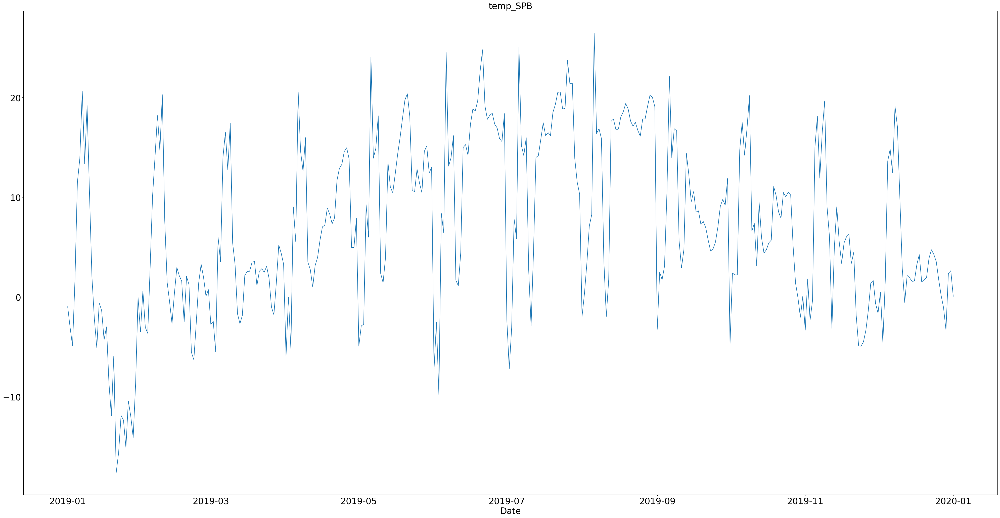

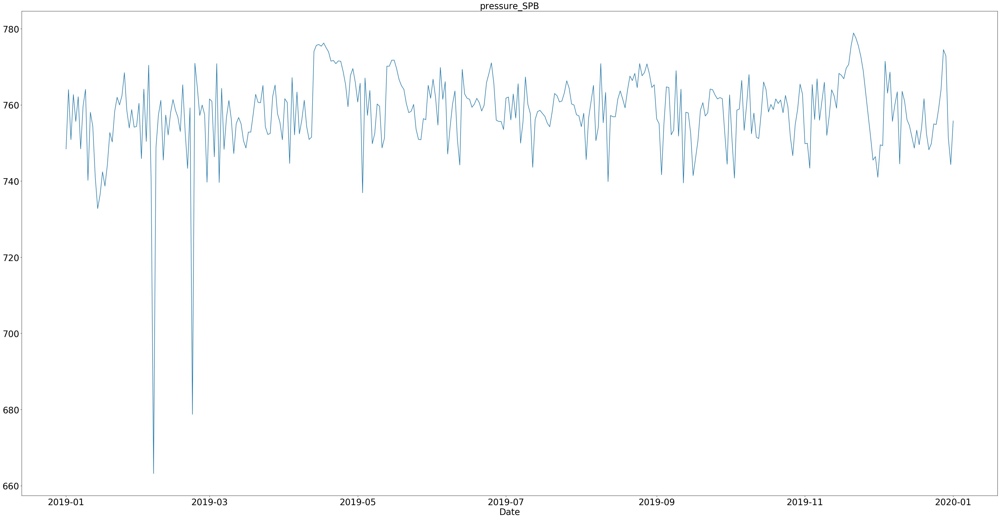

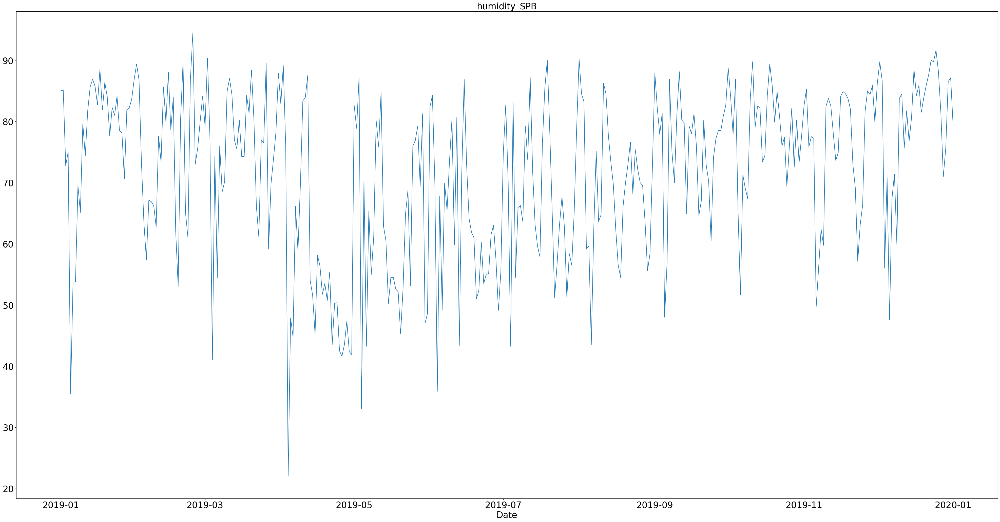

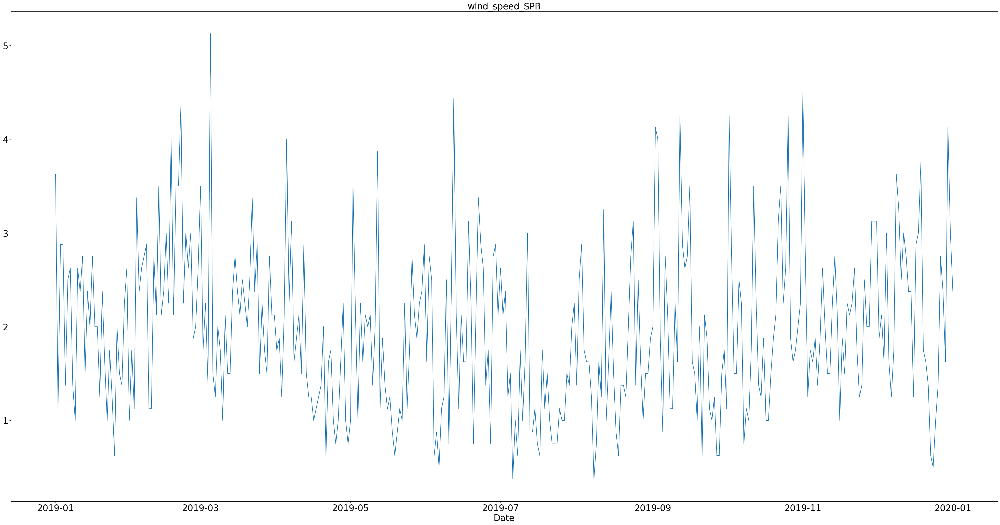

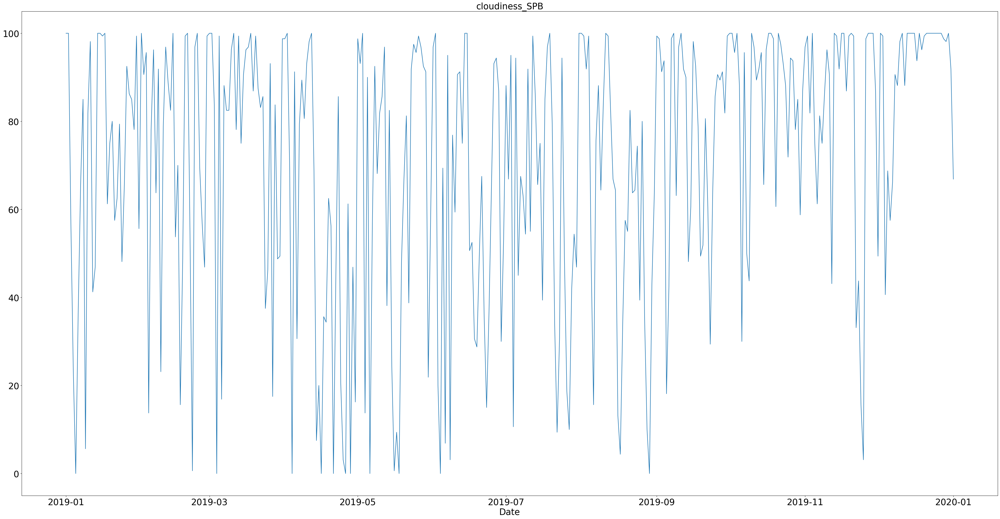

In [268]:
set_graph_params()

for col in weather.columns:
    plt.figure(figsize=(50, 25))
    plt.plot(weather.loc['2019-01-01':'2020-01-01', col])
    plt.xlabel('Date')
    plt.title(col)
    plt.tick_params(axis='x')
    plt.tick_params(axis='y')
    plt.show()

plt.rcParams.update(plt.rcParamsDefault)

In [269]:
print_info(weather)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5801 entries, 2005-01-02 to 2020-11-19
Freq: D
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   temp_SPB        5801 non-null   float64
 1   pressure_SPB    5801 non-null   float64
 2   humidity_SPB    5801 non-null   float64
 3   wind_speed_SPB  5801 non-null   float64
 4   cloudiness_SPB  5801 non-null   float64
dtypes: float64(5)
memory usage: 431.9 KB


,temp_SPB,pressure_SPB,humidity_SPB,wind_speed_SPB,cloudiness_SPB
2005-01-02,-8.457143,753.471429,76.428571,3.000,100.000
2005-01-03,-12.887500,750.987500,71.250000,3.500,93.750
2005-01-04,1.437500,770.875000,77.875000,1.125,37.500
2005-01-05,3.337500,760.875000,90.000000,1.625,100.000
2005-01-06,10.362500,752.125000,85.125000,1.375,99.375
...,...,...,...,...,...
2020-11-15,0.787500,770.137500,79.250000,1.375,95.625
2020-11-16,1.450000,769.125000,80.500000,1.500,87.500
2020-11-17,1.712500,768.262500,79.875000,2.125,100.000
2020-11-18,3.375000,760.225000,89.375000,4.125,100.000


None

,temp_SPB,pressure_SPB,humidity_SPB,wind_speed_SPB,cloudiness_SPB
count,5801.00000,5801.000000,5801.000000,5801.000000,5801.000000
mean,6.85851,758.959963,75.828541,1.982385,71.092592
std,9.48642,13.310025,12.747427,0.922676,28.339672
min,-25.98750,563.750000,22.000000,0.000000,0.000000
25%,0.42500,754.762500,68.125000,1.250000,53.125000
50%,6.51250,759.900000,78.375000,1.875000,79.375000
75%,14.83750,765.037500,85.625000,2.500000,96.250000
max,30.07500,793.212500,99.625000,6.500000,100.000000


## Temperature in Arkhangelsk, Kaliningrad, Pskov, Murmansk<a id="1.10"></a>

In [270]:
arkh = pd.read_csv('datasets/погода_Архангельск.csv', sep=';', index_col=[0], parse_dates=[0])
#kgrad = pd.read_csv('datasets/погода_Калининград.csv', sep=';', index_col=[0], parse_dates=[0])
#pskov = pd.read_csv('datasets/погода_Псков.csv', sep=';', index_col=[0], parse_dates=[0])
#murmansk = pd.read_csv('datasets/погода_Мурманск.csv', sep=';', index_col=[0], parse_dates=[0])

In [271]:
arkh

,T,Po,P,Pa,U,DD,Ff,ff10,ff3,N,...,Cm,Ch,VV,Td,RRR,tR,E,Tg,E',sss
Местное время в Архангельске,,,,,,,,,,,,,,,,,,,,,
2005-01-02 06:00:00,"-8,6","758,6","759,4",NaN,80.0,"Ветер, дующий с юга",5.0,NaN,NaN,100%.,...,Высококучевые башенкообразные или хлопьевидные.,"Перисто-кучевые одни или перисто-кучевые, сопр...",10,"-11,4",Следы осадков,12.0,NaN,NaN,Ровный слой сухого рассыпчатого снега покрывае...,26
2005-01-02 09:00:00,"-8,8","759,5","760,4",NaN,76.0,"Ветер, дующий с юга",5.0,NaN,NaN,100%.,...,Высокослоистые непросвечивающие или слоисто-до...,"Перисто-кучевые одни или перисто-кучевые, сопр...",10,"-12,2",Следы осадков,12.0,NaN,NaN,NaN,NaN
2005-01-02 12:00:00,NaN,"760,8","761,6",NaN,NaN,NaN,NaN,NaN,NaN,"10% или менее, но не 0",...,Высокослоистые непросвечивающие или слоисто-до...,"Перисто-кучевые одни или перисто-кучевые, сопр...","0,4","-10,4",NaN,NaN,NaN,NaN,NaN,NaN
2005-01-02 15:00:00,-7,"761,3","762,2",NaN,74.0,"Ветер, дующий с юга",5.0,NaN,NaN,100%.,...,Высокослоистые непросвечивающие или слоисто-до...,"Перисто-кучевые одни или перисто-кучевые, сопр...",10,"-10,8",NaN,NaN,NaN,NaN,NaN,NaN
2005-01-02 18:00:00,"-7,8","761,8","762,7",NaN,84.0,"Ветер, дующий с юго-юго-востока",4.0,NaN,NaN,100%.,...,Высокослоистые непросвечивающие или слоисто-до...,"Перисто-кучевые одни или перисто-кучевые, сопр...","4,2",-10,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-11-25 09:00:00,"-1,3","755,8","756,5","1,2",98.0,"Ветер, дующий с востоко-юго-востока",1.0,NaN,NaN,100%.,...,NaN,NaN,13,"-1,6",NaN,NaN,NaN,NaN,NaN,NaN
2020-11-25 12:00:00,"-0,8",757,"757,8","1,2",97.0,"Ветер, дующий с юго-востока",1.0,NaN,NaN,100%.,...,NaN,NaN,10,"-1,2",NaN,NaN,NaN,NaN,NaN,NaN
2020-11-25 15:00:00,"-0,6","758,4","759,1","1,4",97.0,"Ветер, дующий с юго-востока",1.0,NaN,NaN,100%.,...,NaN,NaN,2,-1,NaN,NaN,NaN,NaN,NaN,NaN


## USD to RUB Exchange Rate<a id="1.4"></a>

In [272]:
curr = pd.read_csv('datasets/rub_usd_currencies.csv', sep=';', index_col=[0], parse_dates=[0])
curr = curr.loc['2000-01-01':]
curr.columns = ['USD_to_RUB']
curr

,USD_to_RUB
data,
2000-01-01,27.0000
2000-06-01,44100.0000
2000-07-01,27.2300
2000-11-01,27.7300
2000-12-01,28.4400
...,...
2020-11-11,76.3978
2020-12-11,76.2075
2020-11-13,77.1148


In [273]:
curr.index.is_monotonic

False

In [274]:
date_index = pd.date_range(start='2000-01-01', end='2020-11-17', freq='1D')
date_index

DatetimeIndex(['2000-01-01', '2000-01-02', '2000-01-03', '2000-01-04',
               '2000-01-05', '2000-01-06', '2000-01-07', '2000-01-08',
               '2000-01-09', '2000-01-10',
               ...
               '2020-11-08', '2020-11-09', '2020-11-10', '2020-11-11',
               '2020-11-12', '2020-11-13', '2020-11-14', '2020-11-15',
               '2020-11-16', '2020-11-17'],
              dtype='datetime64[ns]', length=7627, freq='D')

In [275]:
curr = curr.reindex(date_index)
curr.isna().sum()

USD_to_RUB    2453
dtype: int64

In [276]:
interpolation(curr)

2453 missing entries, interpolating...
interpolating done, 0 missing entries left


In [277]:
print_info(curr)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 7627 entries, 2000-01-01 to 2020-11-17
Freq: D
Data columns (total 1 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   USD_to_RUB  7627 non-null   float64
dtypes: float64(1)
memory usage: 119.2 KB


,USD_to_RUB
2000-01-01,27.0000
2000-01-02,28.5500
2000-01-03,28.6500
2000-01-04,44010.0000
2000-01-05,22019.1150
...,...
2020-11-13,77.1148
2020-11-14,77.3262
2020-11-15,77.1907
2020-11-16,77.0552


None

,USD_to_RUB
count,7627.000000
mean,838.137923
std,5570.677656
min,23.125500
25%,28.586050
50%,31.136500
75%,58.502675
max,44195.000000


In [278]:
curr[curr['USD_to_RUB'] > 81] #Anomaly, 80.96 (18.03.2020) - max historical value to date (24.11.2020)

,USD_to_RUB
2000-01-04,44010.0000
2000-01-05,22019.1150
2000-01-07,43979.0000
2000-02-25,44071.0000
2000-02-26,44040.0000
...,...
2004-06-16,43890.0000
2004-10-07,44164.0000
2010-10-27,43951.0000
2016-01-22,83.5913


In [279]:
curr[curr['USD_to_RUB'] > 81] = None
interpolation(curr)

170 missing entries, interpolating...
interpolating done, 0 missing entries left


In [280]:
print_info(curr)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 7627 entries, 2000-01-01 to 2020-11-17
Freq: D
Data columns (total 1 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   USD_to_RUB  7627 non-null   float64
dtypes: float64(1)
memory usage: 119.2 KB


,USD_to_RUB
2000-01-01,27.0000
2000-01-02,28.5500
2000-01-03,28.6500
2000-01-04,28.5100
2000-01-05,28.3700
...,...
2020-11-13,77.1148
2020-11-14,77.3262
2020-11-15,77.1907
2020-11-16,77.0552


None

,USD_to_RUB
count,7627.000000
mean,39.480982
std,16.054311
min,23.125500
25%,28.538600
50%,30.943600
75%,57.268850
max,80.881500


Text(0.5, 1.0, 'USD to RUB rate')

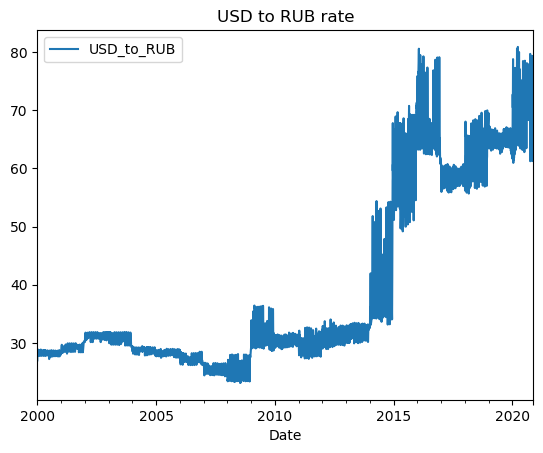

In [281]:
curr.plot()
plt.xlabel('Date')
plt.title('USD to RUB rate')

## Population<a id="1.5"></a>

In [282]:
pop = pd.read_csv('datasets/Naselenie.csv', sep=';', index_col=[0])
pop

,Москва,5085581,7061008,8010954,8967232,10382754,11503501,11979529,12108257,12197596,12330126,12380664,12506468,12615279,12678079
1,,,,,,,,,,,,,,,
2,Московская область,5863003,5774529,6359385,6693623,6618538,7095120,7048084,7133620,7231068,7318647,7423470,7503385,7599647,7690863
3,Краснодарский край,3477809,4124163,4410331,4680560,5125221,5226647,5330181,5404273,5453329,5513804,5570945,5603420,5648235,5675462
4,Санкт-Петербург,3321196,3949501,4588183,5023506,4661219,4879566,5028000,5131942,5191690,5225690,5281579,5351935,5383890,5398064
5,Свердловская область,4044416,4319741,4453491,4716768,4486214,4297747,4315830,4320677,4327472,4330006,4329341,4325256,4315699,4310681
6,Ростовская область,3311747,3831262,4080647,4308654,4404013,4277976,4254613,4245532,4242080,4236000,4231355,4220452,4202320,4197821
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81,Республика Алтай,157161,168261,171835,191649,202947,206168,210344,211645,213703,215161,217007,218063,218866,220181
82,Еврейская автономная область,162856,172449,190219,215937,190915,176558,172671,170377,168368,166120,164217,162014,159913,158305
83,Магаданская область,188889,251297,332845,385340,182726,156996,152358,150312,148071,146345,145570,144091,141234,140149


In [283]:
Moscow = list(pop.columns)
pop.loc[87] = Moscow
pop.columns = ['subject of Russia', 1959, 1970, 1979, 1989, 2002, 2010] + list(range(2013, 2021))
pop

,subject of Russia,1959,1970,1979,1989,2002,2010,2013,2014,2015,2016,2017,2018,2019,2020
1,,,,,,,,,,,,,,,
2,Московская область,5863003,5774529,6359385,6693623,6618538,7095120,7048084,7133620,7231068,7318647,7423470,7503385,7599647,7690863
3,Краснодарский край,3477809,4124163,4410331,4680560,5125221,5226647,5330181,5404273,5453329,5513804,5570945,5603420,5648235,5675462
4,Санкт-Петербург,3321196,3949501,4588183,5023506,4661219,4879566,5028000,5131942,5191690,5225690,5281579,5351935,5383890,5398064
5,Свердловская область,4044416,4319741,4453491,4716768,4486214,4297747,4315830,4320677,4327472,4330006,4329341,4325256,4315699,4310681
6,Ростовская область,3311747,3831262,4080647,4308654,4404013,4277976,4254613,4245532,4242080,4236000,4231355,4220452,4202320,4197821
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82,Еврейская автономная область,162856,172449,190219,215937,190915,176558,172671,170377,168368,166120,164217,162014,159913,158305
83,Магаданская область,188889,251297,332845,385340,182726,156996,152358,150312,148071,146345,145570,144091,141234,140149
84,Чукотский автономный округ,46689,101184,132859,157528,53824,50526,50780,50555,50540,50157,49822,49348,49663,50288


In [284]:
pop = pop.T
pop

1,2,3,4,5,6,7,8,9,10,11,...,77,78,79,80,81,82,83,84,85,87
subject of Russia,Московская область,Краснодарский край,Санкт-Петербург,Свердловская область,Ростовская область,Республика Башкортостан,Республика Татарстан,Тюменская область,Челябинская область,Нижегородская область,...,Севастополь,Республика Тыва,Камчатский край,Республика Калмыкия,Республика Алтай,Еврейская автономная область,Магаданская область,Чукотский автономный округ,Ненецкий автономный округ,Москва
1959,5863003,3477809,3321196,4044416,3311747,3341609,2850417,1092126,2976625,3590274,...,152122,171928,220753,184857,157161,162856,188889,46689,36881,5085581
1970,5774529,4124163,3949501,4319741,3831262,3818075,3131238,1406101,3288801,3682484,...,254935,230864,287612,267993,168261,172449,251297,101184,39119,7061008
1979,6359385,4410331,4588183,4453491,4080647,3848627,3435644,1887152,3438866,3695523,...,333087,266453,378491,293528,171835,190219,332845,132859,47001,8010954
1989,6693623,4680560,5023506,4716768,4308654,3950482,3637809,3080621,3623732,3714322,...,392826,309129,466096,322589,191649,215937,385340,157528,54840,8967232
2002,6618538,5125221,4661219,4486214,4404013,4104336,3779265,3264841,3603339,3524028,...,376200,305510,358801,292410,202947,190915,182726,53824,41546,10382754
2010,7095120,5226647,4879566,4297747,4277976,4072292,3786488,3395755,3476217,3310597,...,378858,307930,322079,289481,206168,176558,156996,50526,42090,11503501
2013,7048084,5330181,5028000,4315830,4254613,4060957,3822038,3510683,3485272,3289841,...,381474,310460,320549,284140,210344,172671,152358,50780,42789,11979529
2014,7133620,5404273,5131942,4320677,4245532,4069698,3838230,3546345,3490053,3281496,...,383907,311761,319864,282021,211645,170377,150312,50555,43025,12108257
2015,7231068,5453329,5191690,4327472,4242080,4071987,3855037,3581293,3497274,3270203,...,398973,313777,317269,280564,213703,168368,148071,50540,43373,12197596


## Gas<a id="1.6"></a>

In [285]:
gas = pd.read_csv('datasets/prirodnyi-gaz_quotes.csv', sep=';', index_col=[0], parse_dates=[0])
gas = gas[['average']]
gas = gas[::-1]
gas.index.name = 'date'
gas.columns = ['gas_avg_price']
gas

,gas_avg_price
date,
2002-06-06,3.1815
2002-06-09,3.1600
2002-06-10,3.1325
2002-06-11,3.1100
2002-06-12,3.1550
...,...
2020-11-16,2.7915
2020-11-17,2.6905
2020-11-18,2.7350


In [286]:
date_index = pd.date_range(start='2002-06-07', end='2020-11-20', freq='1D')
date_index

DatetimeIndex(['2002-06-07', '2002-06-08', '2002-06-09', '2002-06-10',
               '2002-06-11', '2002-06-12', '2002-06-13', '2002-06-14',
               '2002-06-15', '2002-06-16',
               ...
               '2020-11-11', '2020-11-12', '2020-11-13', '2020-11-14',
               '2020-11-15', '2020-11-16', '2020-11-17', '2020-11-18',
               '2020-11-19', '2020-11-20'],
              dtype='datetime64[ns]', length=6742, freq='D')

In [287]:
gas = gas.reindex(date_index)
gas.isna().sum()

gas_avg_price    1258
dtype: int64

In [288]:
interpolation(gas)

1258 missing entries, interpolating...
interpolating done, 2 missing entries left


In [289]:
gas[gas['gas_avg_price'].isna()]

,gas_avg_price
2002-06-07,NaN
2002-06-08,NaN


In [290]:
gas.dropna(inplace=True)
gas.isna().sum()

gas_avg_price    0
dtype: int64

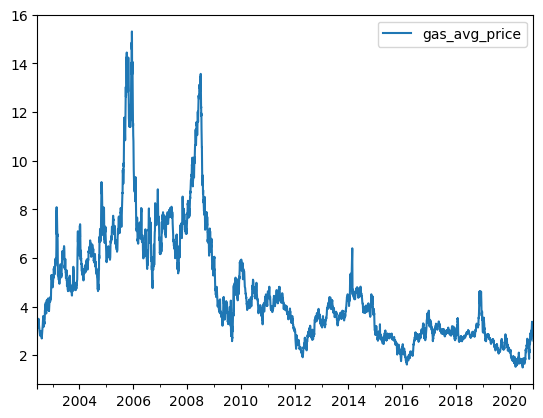

In [291]:
gas.plot()

In [292]:
print_info(gas)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 6740 entries, 2002-06-09 to 2020-11-20
Freq: D
Data columns (total 1 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   gas_avg_price  6740 non-null   float64
dtypes: float64(1)
memory usage: 105.3 KB


,gas_avg_price
2002-06-09,3.1600
2002-06-10,3.1325
2002-06-11,3.1100
2002-06-12,3.1550
2002-06-13,3.2675
...,...
2020-11-16,2.7915
2020-11-17,2.6905
2020-11-18,2.7350
2020-11-19,2.6345


None

,gas_avg_price
count,6740.000000
mean,4.607503
std,2.327213
min,1.499500
25%,2.872375
50%,3.935250
75%,5.915000
max,15.315500


## Oil<a id="1.7"></a>

In [293]:
oil = pd.read_csv('datasets/oil_price.csv', sep=';', index_col=[0], parse_dates=[0])
oil['close USD/barrel'] = oil['close USD/barrel'].str.replace(',', '.').astype('float32')
oil['open USD/barrel'] = oil['open USD/barrel'].str.replace(',', '.').astype('float32')
oil['oil_avg_price'] = ((oil['close USD/barrel'] + oil['open USD/barrel']) / 2).round(2)
oil

,close USD/barrel,open USD/barrel,max USD/barrel,min USD/barrel,oil_avg_price
date,,,,,
2006-10-26,60.770000,62.250000,"62,35","60,47",61.509998
2006-10-27,61.080002,60.950001,"61,33","60,13",61.020000
2006-10-30,58.680000,61.200001,"61,20","58,53",59.939999
2006-10-31,59.029999,58.770000,"59,14","57,39",58.900002
2006-01-11,58.980000,58.849998,"59,67","58,01",58.919998
...,...,...,...,...,...
2020-11-18,44.340000,43.750000,"44,89","43,48",44.040001
2020-11-19,44.200001,43.959999,"44,57","43,79",44.080002
2020-11-20,44.959999,44.150002,"45,24","44,05",44.560001


In [294]:
oil = oil[['oil_avg_price']]
oil

,oil_avg_price
date,
2006-10-26,61.509998
2006-10-27,61.020000
2006-10-30,59.939999
2006-10-31,58.900002
2006-01-11,58.919998
...,...
2020-11-18,44.040001
2020-11-19,44.080002
2020-11-20,44.560001


In [295]:
oil.index.is_monotonic

False

In [296]:
date_index = pd.date_range(start='2006-10-26', end='2020-11-24', freq='1D')
date_index

DatetimeIndex(['2006-10-26', '2006-10-27', '2006-10-28', '2006-10-29',
               '2006-10-30', '2006-10-31', '2006-11-01', '2006-11-02',
               '2006-11-03', '2006-11-04',
               ...
               '2020-11-15', '2020-11-16', '2020-11-17', '2020-11-18',
               '2020-11-19', '2020-11-20', '2020-11-21', '2020-11-22',
               '2020-11-23', '2020-11-24'],
              dtype='datetime64[ns]', length=5144, freq='D')

In [297]:
oil = oil.reindex(date_index)
oil.isna().sum()

oil_avg_price    1566
dtype: int64

In [298]:
interpolation(oil)

1566 missing entries, interpolating...
interpolating done, 0 missing entries left


In [299]:
print_info(oil)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5144 entries, 2006-10-26 to 2020-11-24
Freq: D
Data columns (total 1 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   oil_avg_price  5144 non-null   float32
dtypes: float32(1)
memory usage: 60.3 KB


,oil_avg_price
2006-10-26,61.509998
2006-10-27,61.020000
2006-10-28,60.660000
2006-10-29,60.299999
2006-10-30,59.939999
...,...
2020-11-20,44.560001
2020-11-21,44.896667
2020-11-22,45.233334
2020-11-23,45.570000


None

,oil_avg_price
count,5144.000000
mean,76.945412
std,26.045725
min,20.180000
25%,55.820000
50%,71.775002
75%,104.826666
max,145.770004


## Coal<a id="1.8"></a>

In [300]:
coal = pd.read_csv('datasets/coal_price.csv', sep=';', index_col=[0], parse_dates=[0])
coal

,close USD/ton,open USD/ton,max USD/ton,min USD/ton
date,,,,
2010-01-19,"54,00",NaN,NaN,NaN
2010-01-20,"53,07",NaN,NaN,NaN
2010-01-21,"52,50",NaN,NaN,NaN
2010-01-22,"51,95",NaN,NaN,NaN
2010-01-25,"51,45",NaN,NaN,NaN
...,...,...,...,...
2020-03-11,"51,05","50,90","51,25","50,90"
2020-04-11,"50,85","50,80","50,85","50,80"
2020-05-11,"51,40","50,85","51,25","50,85"


In [301]:
coal = coal[['close USD/ton']].rename(columns={'close USD/ton': 'coal_close_price'})
coal['coal_close_price'] = coal['coal_close_price'].str.replace(',', '.').astype('float32')
coal

,coal_close_price
date,
2010-01-19,54.000000
2010-01-20,53.070000
2010-01-21,52.500000
2010-01-22,51.950001
2010-01-25,51.450001
...,...
2020-03-11,51.049999
2020-04-11,50.849998
2020-05-11,51.400002


In [302]:
coal.index.is_monotonic

False

In [303]:
date_index = pd.date_range(start='2010-01-19', end='2020-09-11', freq='1D')
date_index

DatetimeIndex(['2010-01-19', '2010-01-20', '2010-01-21', '2010-01-22',
               '2010-01-23', '2010-01-24', '2010-01-25', '2010-01-26',
               '2010-01-27', '2010-01-28',
               ...
               '2020-09-02', '2020-09-03', '2020-09-04', '2020-09-05',
               '2020-09-06', '2020-09-07', '2020-09-08', '2020-09-09',
               '2020-09-10', '2020-09-11'],
              dtype='datetime64[ns]', length=3889, freq='D')

In [304]:
coal = coal.reindex(date_index)
coal.isna().sum()

coal_close_price    1315
dtype: int64

In [305]:
interpolation(coal)

1315 missing entries, interpolating...
interpolating done, 0 missing entries left


In [306]:
print_info(coal)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3889 entries, 2010-01-19 to 2020-09-11
Freq: D
Data columns (total 1 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   coal_close_price  3889 non-null   float32
dtypes: float32(1)
memory usage: 45.6 KB


,coal_close_price
2010-01-19,54.000000
2010-01-20,53.070000
2010-01-21,52.500000
2010-01-22,51.950001
2010-01-23,51.783333
...,...
2020-09-07,49.299999
2020-09-08,50.250000
2020-09-09,51.200001
2020-09-10,57.599998


None

,coal_close_price
count,3889.000000
mean,56.704960
std,10.511058
min,34.049999
25%,49.150002
50%,56.830002
75%,62.900002
max,83.449997


## Current frequency<a id="1.9"></a>

In [307]:
freq = pd.read_csv('datasets/freq.csv', sep=';', index_col=[0], parse_dates=[0])
freq

,"Частота, Гц"
Время Мск,
2000-01-01 00:00:00,49.97
2000-01-01 01:00:00,49.97
2000-01-01 02:00:00,49.98
2000-01-01 03:00:00,49.99
2000-01-01 04:00:00,49.98
...,...
2020-11-25 19:00:00,50.00
2020-11-25 20:00:00,50.00
2020-11-25 21:00:00,50.01


In [308]:
freq.rename(columns={'Частота, Гц': 'frequency'}, inplace=True)
freq.index.name = 'date'
freq = freq.resample('1D').mean()
freq

,frequency
date,
2000-01-01,49.985000
2000-01-02,49.985000
2000-01-03,49.985000
2000-01-04,49.985000
2000-01-05,49.985000
...,...
2020-12-07,50.002083
2020-12-08,50.004167
2020-12-09,50.006667


In [309]:
date_index = pd.date_range(start='2000-01-01', end='2020-12-11', freq='1D')
date_index

DatetimeIndex(['2000-01-01', '2000-01-02', '2000-01-03', '2000-01-04',
               '2000-01-05', '2000-01-06', '2000-01-07', '2000-01-08',
               '2000-01-09', '2000-01-10',
               ...
               '2020-12-02', '2020-12-03', '2020-12-04', '2020-12-05',
               '2020-12-06', '2020-12-07', '2020-12-08', '2020-12-09',
               '2020-12-10', '2020-12-11'],
              dtype='datetime64[ns]', length=7651, freq='D')

In [310]:
freq.index.is_monotonic

True

In [311]:
interpolation(freq)

41 missing entries, interpolating...
interpolating done, 0 missing entries left


In [312]:
print_info(freq)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 7651 entries, 2000-01-01 to 2020-12-11
Freq: D
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   frequency  7651 non-null   float64
dtypes: float64(1)
memory usage: 119.5 KB


,frequency
date,
2000-01-01,49.985000
2000-01-02,49.985000
2000-01-03,49.985000
2000-01-04,49.985000
2000-01-05,49.985000
...,...
2020-12-07,50.002083
2020-12-08,50.004167
2020-12-09,50.006667


None

,frequency
count,7651.000000
mean,50.000833
std,0.011534
min,49.904583
25%,50.000000
50%,50.002500
75%,50.005000
max,50.029583


# 2. Energy balance analysis (decomposition)<a id="2"></a>

In [313]:
from statsmodels.tsa.seasonal import seasonal_decompose

In [314]:
gen_dec = seasonal_decompose(energynw['generation_NW_UES'])
con_dec = seasonal_decompose(energynw['consumption_NW_UES'])

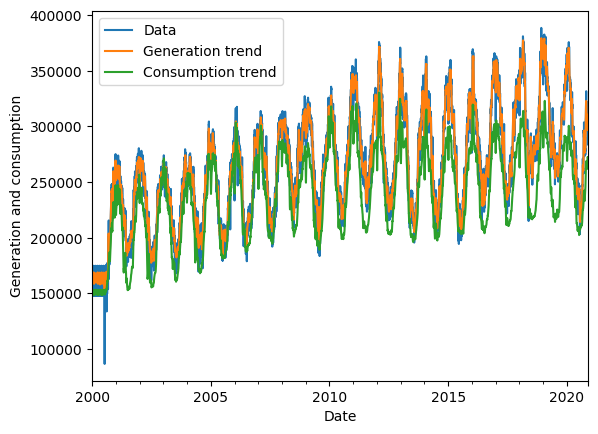

In [315]:
ax = energynw['generation_NW_UES'].plot()
gen_dec.trend.plot()
con_dec.trend.plot()
plt.xlabel('Date')
plt.ylabel('Generation and consumption')
plt.legend(['Data', 'Generation trend', 'Consumption trend'])

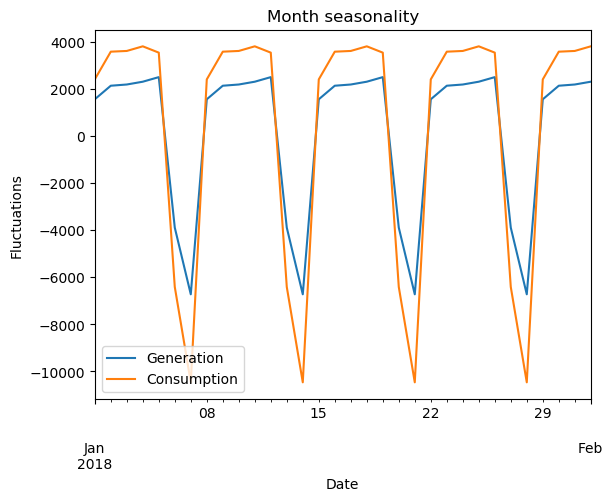

In [316]:
ax = gen_dec.seasonal['2018-01-01': '2018-02-01'].plot()
con_dec.seasonal['2018-01-01': '2018-02-01'].plot()
plt.xlabel('Date')
plt.ylabel('Fluctuations')
plt.title('Month seasonality')
plt.legend(['Generation', 'Consumption'])

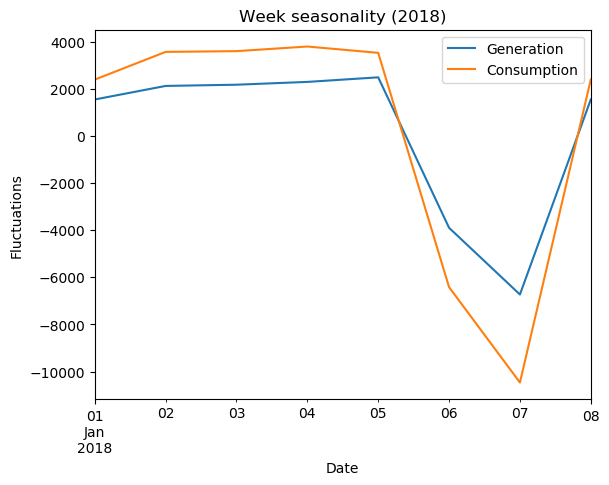

In [317]:
ax = gen_dec.seasonal['2018-01-01': '2018-01-08'].plot()
con_dec.seasonal['2018-01-01': '2018-01-08'].plot()
plt.xlabel('Date')
plt.ylabel('Fluctuations')
plt.title('Week seasonality (2018)')
plt.legend(['Generation', 'Consumption'])

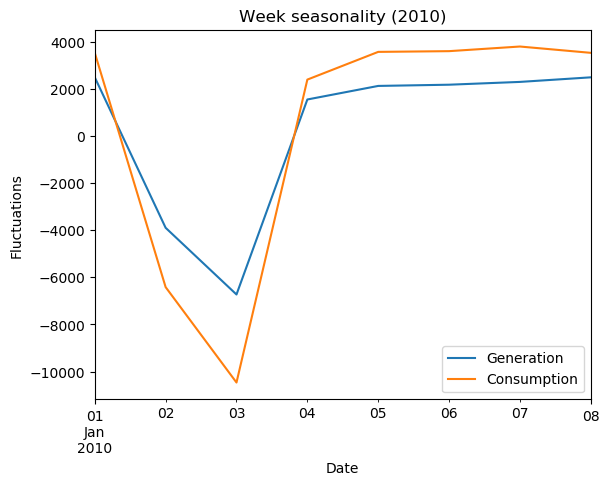

In [318]:
ax = gen_dec.seasonal['2010-01-01': '2010-01-08'].plot()
con_dec.seasonal['2010-01-01': '2010-01-08'].plot()
plt.xlabel('Date')
plt.ylabel('Fluctuations')
plt.title('Week seasonality (2010)')
plt.legend(['Generation', 'Consumption'])

Local minimum is on Sunday.

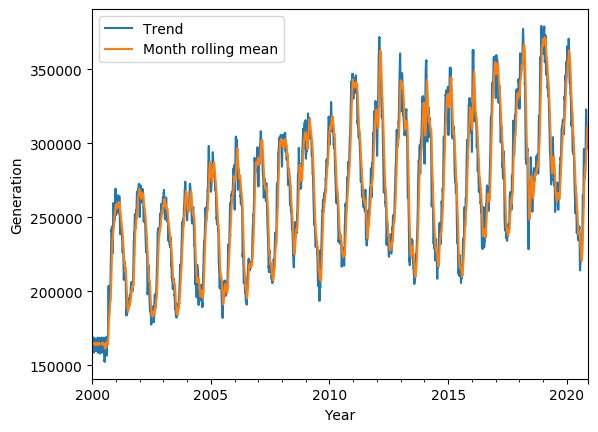

In [319]:
ax = gen_dec.trend.plot()
energynw['generation_NW_UES'].rolling(30).mean().plot()
plt.xlabel('Year')
plt.ylabel('Generation')
plt.legend(['Trend', 'Month rolling mean'])

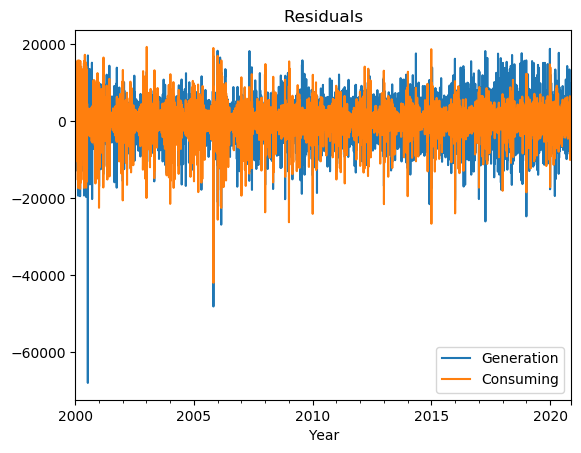

In [320]:
gen_dec.resid.plot()
con_dec.resid.plot()
plt.xlabel('Year')
plt.title('Residuals')
plt.legend(['Generation', 'Consuming'])

# 3. Dataset Creation<a id="3"></a>
## 3.1 Setting Dataset for Analysis<a id="3.1"></a>

Let's combine all the data we have and get dataset.

In [321]:
display(energy, temp, energynw, temp_nw, weather, curr, gas, coal, oil, freq)

,generation_UES,consumption_UES
2000-01-01,1714188.0,1685503.0
2000-01-02,1676017.0,1646886.0
2000-01-03,1821309.0,1786437.0
2000-01-04,1831355.0,1792719.0
2000-01-05,1829575.0,1796560.0
...,...,...
2020-11-17,3205982.0,3172629.0
2020-11-18,3241331.0,3201471.0
2020-11-19,3238289.0,3195763.0
2020-11-20,3224532.0,3191706.0


,temp_UES
2003-10-13,7.21
2003-10-14,7.35
2003-10-15,6.42
2003-10-16,5.67
2003-10-17,5.43
...,...
2020-11-21,-3.36
2020-11-22,-4.26
2020-11-23,-3.86
2020-11-24,-3.15


,generation_NW_UES,consumption_NW_UES
2000-01-01,147784.0,145101.0
2000-01-02,148883.0,143112.0
2000-01-03,162189.0,157895.0
2000-01-04,161764.0,155811.0
2000-01-05,165393.0,156634.0
...,...,...
2020-11-17,303823.0,276584.0
2020-11-18,297406.0,278124.0
2020-11-19,295603.0,270992.0
2020-11-20,298231.0,273451.0


,temp_NW
2006-01-01,-1.50
2006-01-02,-22.10
2006-01-03,-13.50
2006-01-04,3.10
2006-01-05,7.30
...,...
2020-11-21,-0.18
2020-11-22,1.18
2020-11-23,2.24
2020-11-24,0.80


,temp_SPB,pressure_SPB,humidity_SPB,wind_speed_SPB,cloudiness_SPB
2005-01-02,-8.457143,753.471429,76.428571,3.000,100.000
2005-01-03,-12.887500,750.987500,71.250000,3.500,93.750
2005-01-04,1.437500,770.875000,77.875000,1.125,37.500
2005-01-05,3.337500,760.875000,90.000000,1.625,100.000
2005-01-06,10.362500,752.125000,85.125000,1.375,99.375
...,...,...,...,...,...
2020-11-15,0.787500,770.137500,79.250000,1.375,95.625
2020-11-16,1.450000,769.125000,80.500000,1.500,87.500
2020-11-17,1.712500,768.262500,79.875000,2.125,100.000
2020-11-18,3.375000,760.225000,89.375000,4.125,100.000


,USD_to_RUB
2000-01-01,27.0000
2000-01-02,28.5500
2000-01-03,28.6500
2000-01-04,28.5100
2000-01-05,28.3700
...,...
2020-11-13,77.1148
2020-11-14,77.3262
2020-11-15,77.1907
2020-11-16,77.0552


,gas_avg_price
2002-06-09,3.1600
2002-06-10,3.1325
2002-06-11,3.1100
2002-06-12,3.1550
2002-06-13,3.2675
...,...
2020-11-16,2.7915
2020-11-17,2.6905
2020-11-18,2.7350
2020-11-19,2.6345


,coal_close_price
2010-01-19,54.000000
2010-01-20,53.070000
2010-01-21,52.500000
2010-01-22,51.950001
2010-01-23,51.783333
...,...
2020-09-07,49.299999
2020-09-08,50.250000
2020-09-09,51.200001
2020-09-10,57.599998


,oil_avg_price
2006-10-26,61.509998
2006-10-27,61.020000
2006-10-28,60.660000
2006-10-29,60.299999
2006-10-30,59.939999
...,...
2020-11-20,44.560001
2020-11-21,44.896667
2020-11-22,45.233334
2020-11-23,45.570000


,frequency
date,
2000-01-01,49.985000
2000-01-02,49.985000
2000-01-03,49.985000
2000-01-04,49.985000
2000-01-05,49.985000
...,...
2020-12-07,50.002083
2020-12-08,50.004167
2020-12-09,50.006667


In [322]:
dataset = energy.join(temp).join(energynw).join(temp_nw).join(weather).join(curr).join(gas).join(coal).join(oil)
#dataset.dropna(inplace=True)
dataset.drop(columns=['generation_UES','generation_NW_UES'], inplace=True)
dataset

,consumption_UES,temp_UES,consumption_NW_UES,temp_NW,temp_SPB,pressure_SPB,humidity_SPB,wind_speed_SPB,cloudiness_SPB,USD_to_RUB,gas_avg_price,coal_close_price,oil_avg_price
2000-01-01,1685503.0,NaN,145101.0,NaN,NaN,NaN,NaN,NaN,NaN,27.0000,NaN,NaN,NaN
2000-01-02,1646886.0,NaN,143112.0,NaN,NaN,NaN,NaN,NaN,NaN,28.5500,NaN,NaN,NaN
2000-01-03,1786437.0,NaN,157895.0,NaN,NaN,NaN,NaN,NaN,NaN,28.6500,NaN,NaN,NaN
2000-01-04,1792719.0,NaN,155811.0,NaN,NaN,NaN,NaN,NaN,NaN,28.5100,NaN,NaN,NaN
2000-01-05,1796560.0,NaN,156634.0,NaN,NaN,NaN,NaN,NaN,NaN,28.3700,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-11-17,3172629.0,-6.64,276584.0,0.63,1.7125,768.2625,79.875,2.125,100.000,76.9197,2.6905,NaN,43.820000
2020-11-18,3201471.0,-6.71,278124.0,1.15,3.3750,760.2250,89.375,4.125,100.000,NaN,2.7350,NaN,44.040001
2020-11-19,3195763.0,-5.56,270992.0,5.54,10.1250,749.8875,85.125,4.625,96.875,NaN,2.6345,NaN,44.080002
2020-11-20,3191706.0,-3.62,273451.0,2.32,NaN,NaN,NaN,NaN,NaN,NaN,2.6045,NaN,44.560001


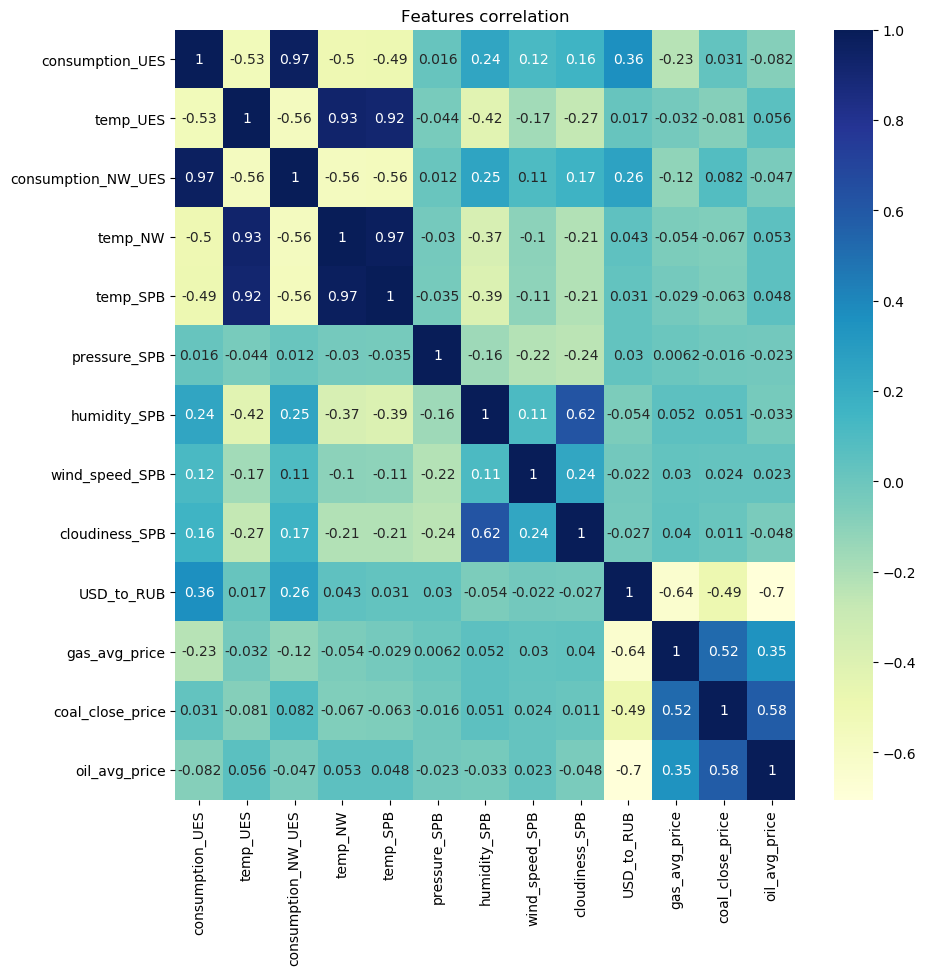

In [323]:
plt.figure(figsize = (10, 10))
sns.heatmap(dataset.corr(), annot = True, cmap="YlGnBu")
plt.title('Features correlation')
plt.show()

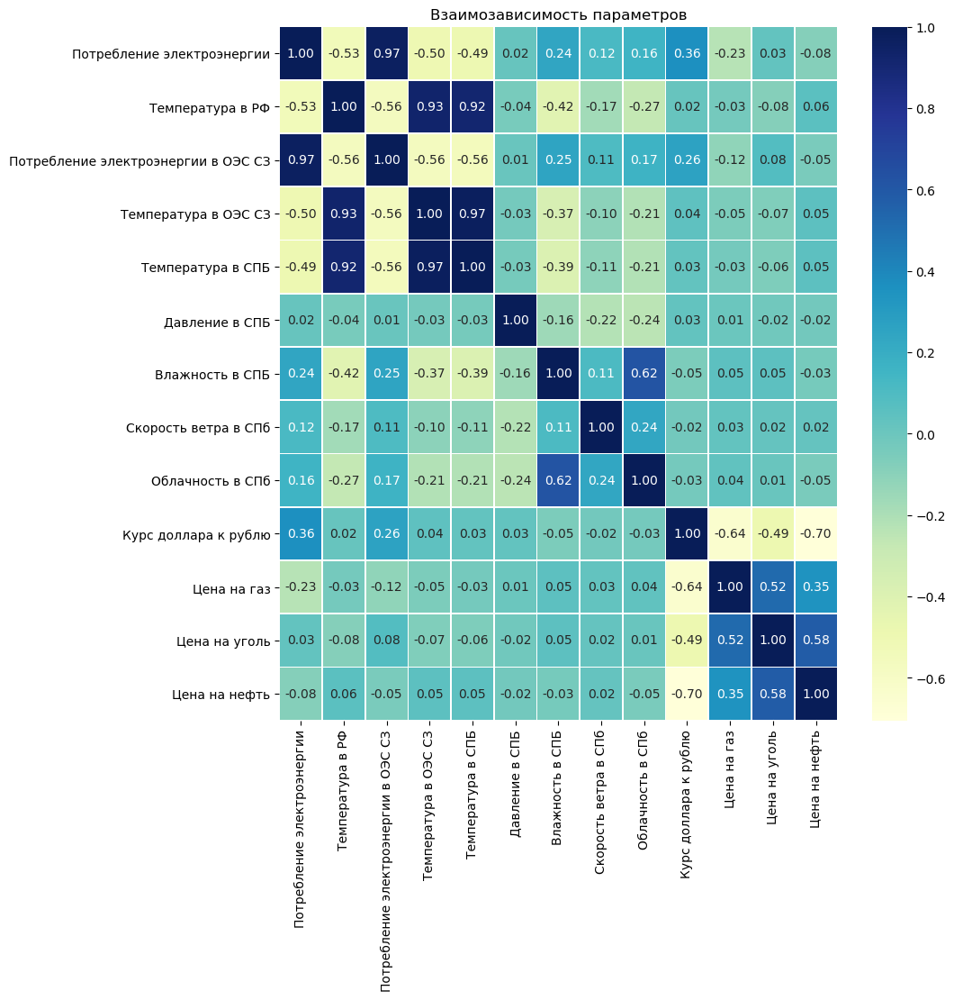

In [324]:
#RU version
dataset.columns = ['Потребление электроэнергии', 'Температура в РФ', 
                   'Потребление электроэнергии в ОЭС СЗ', 'Температура в ОЭС СЗ', 
                   'Температура в СПБ', 'Давление в СПБ', 'Влажность в СПБ','Скорость ветра в СПб', 'Облачность в СПб', 
                   'Курс доллара к рублю', 'Цена на газ', 'Цена на уголь', 'Цена на нефть']
plt.figure(figsize = (10, 10))
sns.heatmap(dataset.corr(), annot = True, cmap="YlGnBu", fmt='.2f',  linewidths=.5)
plt.title('Взаимозависимость параметров')
#plt.xticks(rotation=45)
plt.show()

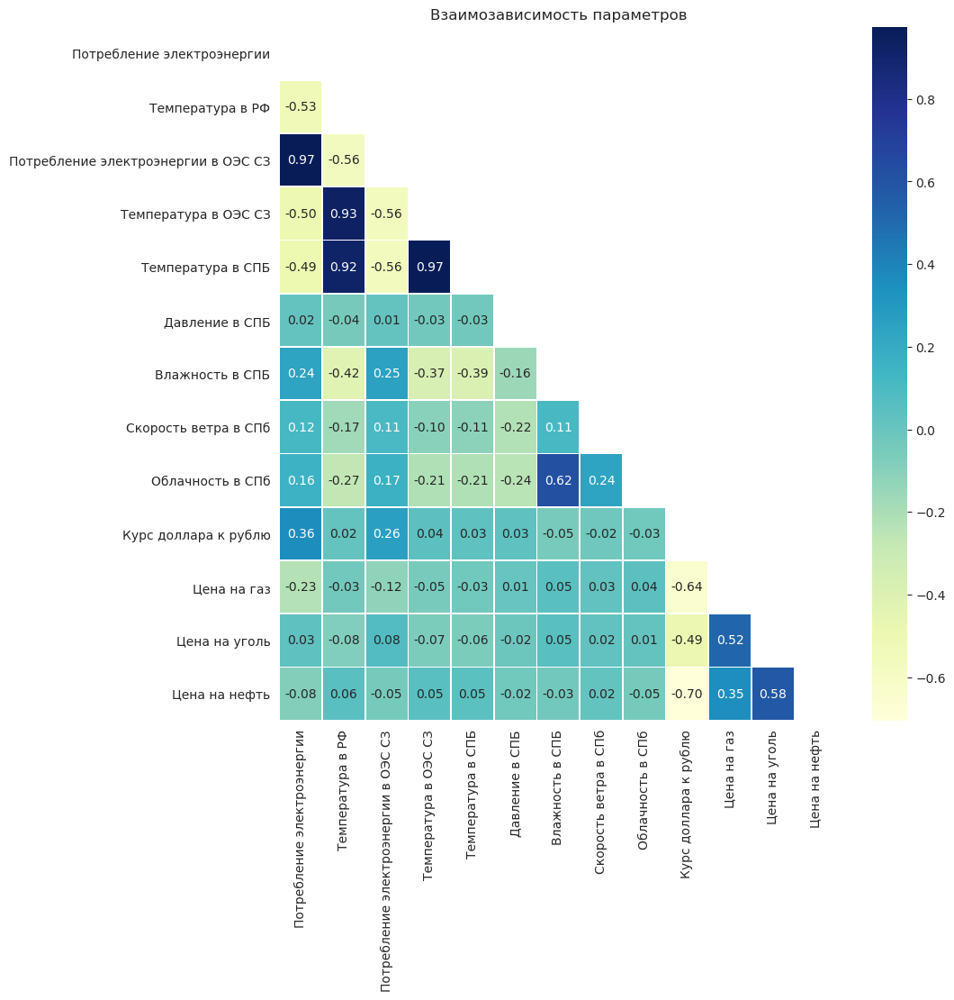

In [325]:
#RU version 2
corr = dataset.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(10, 10))
    ax = sns.heatmap(corr, mask=mask, annot = True, cmap="YlGnBu", fmt='.2f',  linewidths=.5)
    plt.title('Взаимозависимость параметров')

In [121]:
save_dataset(dataset, for_ml=False)

## 3.1 Setting Dataset for Model<a id="3.2"></a>

In [411]:
dataset = energy.join(temp).join(energynw).join(temp_nw).join(weather).join(curr).join(gas).join(oil).join(freq)
dataset.dropna(inplace=True)
dataset

,generation_UES,consumption_UES,temp_UES,generation_NW_UES,consumption_NW_UES,temp_NW,temp_SPB,pressure_SPB,humidity_SPB,wind_speed_SPB,cloudiness_SPB,USD_to_RUB,gas_avg_price,oil_avg_price,frequency
2006-10-26,2691530.0,2641725.0,7.32,267637.0,251350.0,4.00,5.0125,760.1500,75.000,2.625,75.000,26.902500,8.102000,61.509998,50.007500
2006-10-27,2688409.0,2642640.0,5.90,268786.0,255779.0,4.90,8.7125,748.3250,87.625,4.000,98.750,26.830500,7.967625,61.020000,50.007500
2006-10-28,2556857.0,2510149.0,7.29,258296.0,241051.0,3.80,4.6000,743.1875,78.500,5.875,93.125,26.788400,7.833250,60.660000,50.005833
2006-10-29,2514845.0,2465784.0,4.58,240987.0,241714.0,-1.90,-0.0375,753.8625,84.375,3.000,86.250,26.774833,7.698875,60.299999,50.003333
2006-10-30,2701565.0,2646069.0,3.49,262370.0,262067.0,-1.20,-0.8125,759.6750,81.375,3.125,48.125,26.761267,7.564500,59.939999,50.002083
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-11-13,3108085.0,3071123.0,-1.81,307562.0,273420.0,1.11,4.2375,772.6375,77.000,1.625,80.000,77.114800,3.020000,42.990002,50.008750
2020-11-14,3060452.0,3014307.0,-4.10,307599.0,266863.0,0.14,1.9375,770.3125,77.125,1.375,85.000,77.326200,2.943750,43.080002,50.003333
2020-11-15,3036629.0,3002710.0,-6.23,301942.0,263671.0,0.19,0.7875,770.1375,79.250,1.375,95.625,77.190700,2.867500,43.169998,50.002083
2020-11-16,3169683.0,3141699.0,-6.90,296469.0,274425.0,0.87,1.4500,769.1250,80.500,1.500,87.500,77.055200,2.791500,43.259998,50.000417


In [412]:
print_info(dataset)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5137 entries, 2006-10-26 to 2020-11-17
Freq: D
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   generation_UES      5137 non-null   float64
 1   consumption_UES     5137 non-null   float64
 2   temp_UES            5137 non-null   float64
 3   generation_NW_UES   5137 non-null   float64
 4   consumption_NW_UES  5137 non-null   float64
 5   temp_NW             5137 non-null   float64
 6   temp_SPB            5137 non-null   float64
 7   pressure_SPB        5137 non-null   float64
 8   humidity_SPB        5137 non-null   float64
 9   wind_speed_SPB      5137 non-null   float64
 10  cloudiness_SPB      5137 non-null   float64
 11  USD_to_RUB          5137 non-null   float64
 12  gas_avg_price       5137 non-null   float64
 13  oil_avg_price       5137 non-null   float32
 14  frequency           5137 non-null   float64
dtypes: float32(1), float64(14)
me

,generation_UES,consumption_UES,temp_UES,generation_NW_UES,consumption_NW_UES,temp_NW,temp_SPB,pressure_SPB,humidity_SPB,wind_speed_SPB,cloudiness_SPB,USD_to_RUB,gas_avg_price,oil_avg_price,frequency
2006-10-26,2691530.0,2641725.0,7.32,267637.0,251350.0,4.00,5.0125,760.1500,75.000,2.625,75.000,26.902500,8.102000,61.509998,50.007500
2006-10-27,2688409.0,2642640.0,5.90,268786.0,255779.0,4.90,8.7125,748.3250,87.625,4.000,98.750,26.830500,7.967625,61.020000,50.007500
2006-10-28,2556857.0,2510149.0,7.29,258296.0,241051.0,3.80,4.6000,743.1875,78.500,5.875,93.125,26.788400,7.833250,60.660000,50.005833
2006-10-29,2514845.0,2465784.0,4.58,240987.0,241714.0,-1.90,-0.0375,753.8625,84.375,3.000,86.250,26.774833,7.698875,60.299999,50.003333
2006-10-30,2701565.0,2646069.0,3.49,262370.0,262067.0,-1.20,-0.8125,759.6750,81.375,3.125,48.125,26.761267,7.564500,59.939999,50.002083
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-11-13,3108085.0,3071123.0,-1.81,307562.0,273420.0,1.11,4.2375,772.6375,77.000,1.625,80.000,77.114800,3.020000,42.990002,50.008750
2020-11-14,3060452.0,3014307.0,-4.10,307599.0,266863.0,0.14,1.9375,770.3125,77.125,1.375,85.000,77.326200,2.943750,43.080002,50.003333
2020-11-15,3036629.0,3002710.0,-6.23,301942.0,263671.0,0.19,0.7875,770.1375,79.250,1.375,95.625,77.190700,2.867500,43.169998,50.002083
2020-11-16,3169683.0,3141699.0,-6.90,296469.0,274425.0,0.87,1.4500,769.1250,80.500,1.500,87.500,77.055200,2.791500,43.259998,50.000417


None

,generation_UES,consumption_UES,temp_UES,generation_NW_UES,consumption_NW_UES,temp_NW,temp_SPB,pressure_SPB,humidity_SPB,wind_speed_SPB,cloudiness_SPB,USD_to_RUB,gas_avg_price,oil_avg_price,frequency
count,5.137000e+03,5.137000e+03,5137.000000,5137.000000,5137.000000,5137.000000,5137.000000,5137.000000,5137.000000,5137.000000,5137.000000,5137.000000,5137.000000,5137.000000,5137.000000
mean,2.783018e+06,2.740056e+06,4.605619,284128.753163,250504.112906,4.471861,6.879243,758.777021,75.836894,1.990851,71.139709,44.488872,4.017007,76.988884,50.003331
std,3.339665e+05,3.289562e+05,11.580823,41716.666238,34259.159075,9.796310,9.356397,13.534151,12.825819,0.919382,28.430944,17.461355,2.012415,26.036777,0.002934
min,2.040991e+06,2.045475e+06,-26.110000,183568.000000,175801.000000,-24.520000,-22.625000,563.750000,22.000000,0.125000,0.000000,23.125500,1.499500,20.180000,49.993333
25%,2.497843e+06,2.456761e+06,-5.250000,251334.000000,218516.000000,-2.280000,0.575000,754.550000,67.875000,1.250000,53.125000,29.959800,2.739000,55.880001,50.001250
50%,2.755602e+06,2.711923e+06,5.350000,284112.000000,253153.000000,4.000000,6.287500,759.850000,78.375000,1.875000,79.375000,33.630600,3.474500,71.830002,50.003333
75%,3.066534e+06,3.016709e+06,15.230000,313576.000000,278948.000000,12.800000,14.737500,764.987500,85.750000,2.500000,96.250000,63.127100,4.432000,104.860001,50.005417
max,3.593181e+06,3.519601e+06,25.110000,388549.000000,336811.000000,28.300000,30.075000,793.212500,99.625000,6.375000,100.000000,80.881500,13.572000,145.770004,50.017500


In [413]:
len(pd.date_range(start='2006-10-26', end='2020-11-17', freq='1D'))

5137

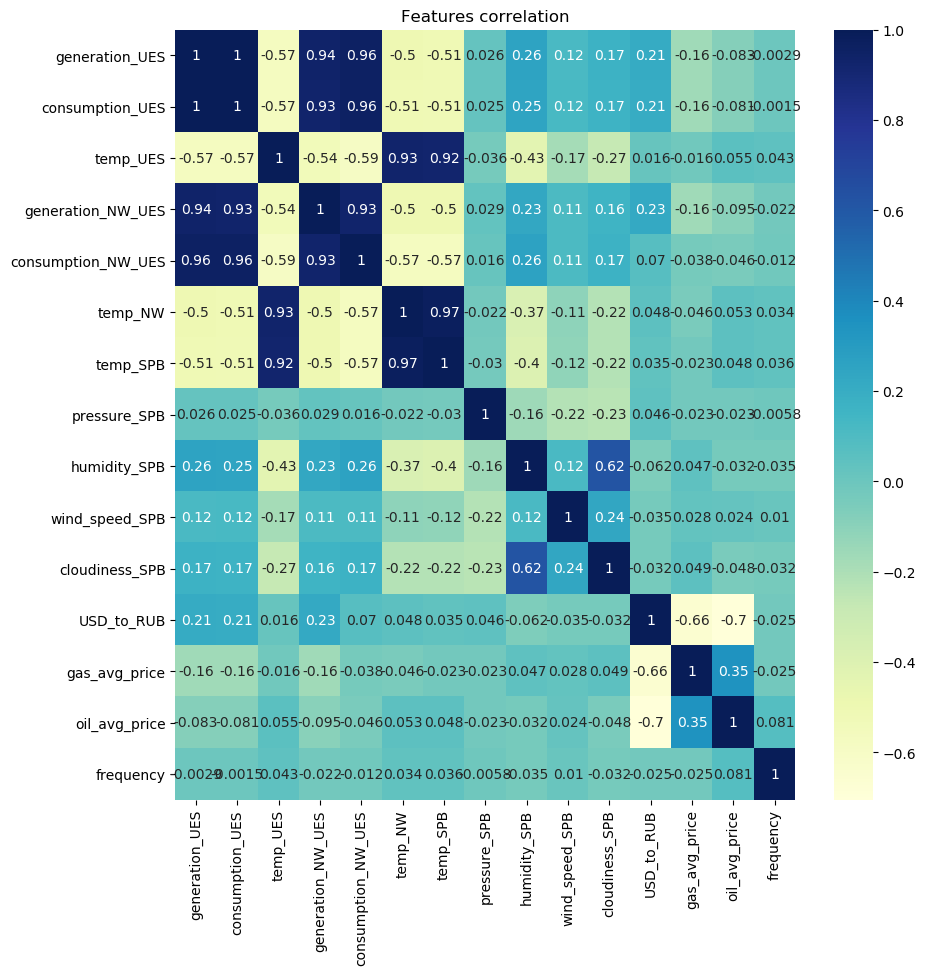

In [414]:
plt.figure(figsize = (10, 10))
sns.heatmap(dataset.corr(), annot = True, cmap="YlGnBu")
plt.title('Features correlation')
plt.show()

In [132]:
dataset = pd.read_csv('dataset_ML_new.csv', index_col=[0], parse_dates=[0], sep=',')
dataset

,consumption_UES,temp_UES,consumption_NW_UES,temp_NW_UES,temp_SPB,pressure_SPB,humidity_SPB,wind_speed_SPB,cloudiness_SPB,USD_to_RUB,gas_avg_price,oil_avg_price
date,,,,,,,,,,,,
2006-10-26,2641725.0,7.32,251350.0,4.00,5.0125,760.1500,75.000,2.625,75.000,26.902500,8.102000,61.51
2006-10-27,2642640.0,5.90,255779.0,4.90,8.7125,748.3250,87.625,4.000,98.750,26.830500,7.967625,61.02
2006-10-28,2510149.0,7.29,241051.0,3.80,4.6000,743.1875,78.500,5.875,93.125,26.788400,7.833250,60.66
2006-10-29,2465784.0,4.58,241714.0,-1.90,-0.0375,753.8625,84.375,3.000,86.250,26.774833,7.698875,60.30
2006-10-30,2646069.0,3.49,262067.0,-1.20,-0.8125,759.6750,81.375,3.125,48.125,26.761267,7.564500,59.94
...,...,...,...,...,...,...,...,...,...,...,...,...
2020-11-23,3174324.0,-3.86,275349.0,2.24,2.5000,748.3000,86.500,3.375,60.000,75.814600,2.730000,49.06
2020-11-24,3165232.0,-3.15,277892.0,0.80,3.0000,753.1000,87.500,2.000,98.000,75.472700,2.780000,49.09
2020-11-25,3172048.0,-3.62,280896.0,-1.34,0.0000,760.3000,88.800,1.375,95.000,75.451800,2.910000,49.10


In [133]:
for feature in dataset.columns:
    for lag in range(1, 31):
        dataset['{}_lag_{}'.format(feature, lag)] = dataset[feature].shift(lag)

In [134]:
dataset.dropna(inplace=True)
dataset

,consumption_UES,temp_UES,consumption_NW_UES,temp_NW_UES,temp_SPB,pressure_SPB,humidity_SPB,wind_speed_SPB,cloudiness_SPB,USD_to_RUB,...,oil_avg_price_lag_21,oil_avg_price_lag_22,oil_avg_price_lag_23,oil_avg_price_lag_24,oil_avg_price_lag_25,oil_avg_price_lag_26,oil_avg_price_lag_27,oil_avg_price_lag_28,oil_avg_price_lag_29,oil_avg_price_lag_30
date,,,,,,,,,,,,,,,,,,,,,
2006-11-25,2769660.0,-4.31,249665.0,3.80,7.7375,760.9750,88.375,3.125,99.375,26.5199,...,59.933334,59.675003,59.416668,59.158333,58.900000,59.940000,60.300000,60.660000,61.02,61.51
2006-11-26,2715888.0,-6.98,244288.0,4.30,7.9625,761.6000,90.125,3.250,99.375,26.4688,...,60.191666,59.933334,59.675003,59.416668,59.158333,58.900000,59.940000,60.300000,60.66,61.02
2006-11-27,2922119.0,-9.29,261362.0,4.60,7.0125,761.1625,89.250,3.000,71.875,26.4177,...,60.450000,60.191666,59.933334,59.675003,59.416668,59.158333,58.900000,59.940000,60.30,60.66
2006-11-28,2941172.0,-10.29,263207.0,4.30,5.3000,764.9750,92.500,2.750,95.000,26.3666,...,60.708336,60.450000,60.191666,59.933334,59.675003,59.416668,59.158333,58.900000,59.94,60.30
2006-11-29,2949865.0,-9.64,263144.0,3.60,6.4500,766.6000,96.000,2.000,100.000,26.3503,...,60.966667,60.708336,60.450000,60.191666,59.933334,59.675003,59.416668,59.158333,58.90,59.94
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-11-23,3174324.0,-3.86,275349.0,2.24,2.5000,748.3000,86.500,3.375,60.000,75.8146,...,53.820000,48.373333,42.926666,37.480000,38.400000,39.860000,40.850000,41.000000,41.36,41.72
2020-11-24,3165232.0,-3.15,277892.0,0.80,3.0000,753.1000,87.500,2.000,98.000,75.4727,...,36.530000,53.820000,48.373333,42.926666,37.480000,38.400000,39.860000,40.850000,41.00,41.36
2020-11-25,3172048.0,-3.62,280896.0,-1.34,0.0000,760.3000,88.800,1.375,95.000,75.4518,...,33.345000,36.530000,53.820000,48.373333,42.926666,37.480000,38.400000,39.860000,40.85,41.00


In [135]:
dataset['year'] = dataset.index.year
dataset['month'] = dataset.index.month
dataset['day'] = dataset.index.day
dataset['dayofweek'] = dataset.index.dayofweek
dataset['consumption_UES_rm'] = dataset['consumption_UES'].shift().rolling(7).mean()
dataset['consumption_NW_rm'] = dataset['consumption_NW_UES'].shift().rolling(7).mean()
dataset.dropna(inplace=True)
dataset

,consumption_UES,temp_UES,consumption_NW_UES,temp_NW_UES,temp_SPB,pressure_SPB,humidity_SPB,wind_speed_SPB,cloudiness_SPB,USD_to_RUB,...,oil_avg_price_lag_27,oil_avg_price_lag_28,oil_avg_price_lag_29,oil_avg_price_lag_30,year,month,day,dayofweek,consumption_UES_rm,consumption_NW_rm
date,,,,,,,,,,,,,,,,,,,,,
2006-12-02,2781786.0,-12.59,253311.0,-8.40,-8.72500,764.9500,82.250,1.250,100.000,28.2155,...,60.191666,59.933334,59.675003,59.416668,2006,12,2,5,2.880638e+06,258592.142857
2006-12-03,2718577.0,-5.88,250016.0,-8.90,-9.16250,769.3375,72.625,1.750,25.625,27.9476,...,60.450000,60.191666,59.933334,59.675003,2006,12,3,6,2.882370e+06,259113.000000
2006-12-04,2880211.0,3.68,267721.0,1.00,1.25000,757.4875,82.375,1.250,81.875,27.6797,...,60.708336,60.450000,60.191666,59.933334,2006,12,4,0,2.882754e+06,259931.285714
2006-12-05,2881878.0,12.67,257123.0,9.30,11.55625,759.6000,52.625,1.125,13.750,27.0755,...,60.966667,60.708336,60.450000,60.191666,2006,12,5,1,2.876768e+06,260839.714286
2006-12-06,2886003.0,15.35,267323.0,13.20,15.35000,770.3250,63.125,1.625,34.375,26.9940,...,61.225000,60.966667,60.708336,60.450000,2006,12,6,2,2.868297e+06,259970.571429
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-11-23,3174324.0,-3.86,275349.0,2.24,2.50000,748.3000,86.500,3.375,60.000,75.8146,...,40.850000,41.000000,41.360000,41.720000,2020,11,23,0,3.151595e+06,273029.285714
2020-11-24,3165232.0,-3.15,277892.0,0.80,3.00000,753.1000,87.500,2.000,98.000,75.4727,...,39.860000,40.850000,41.000000,41.360000,2020,11,24,1,3.156256e+06,273161.285714
2020-11-25,3172048.0,-3.62,280896.0,-1.34,0.00000,760.3000,88.800,1.375,95.000,75.4518,...,38.400000,39.860000,40.850000,41.000000,2020,11,25,2,3.155199e+06,273348.142857


In [136]:
#dataset['generation_NW_UES'] = energynw.loc['2006-12-02':'2020-11-21', 'generation_NW_UES']
#dataset
#interpolation(dataset)

In [137]:
dataset.isna().sum().sum()

0

In [138]:
print_info(dataset)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5110 entries, 2006-12-02 to 2020-11-27
Columns: 378 entries, consumption_UES to consumption_NW_rm
dtypes: float64(374), int64(4)
memory usage: 14.8 MB


,consumption_UES,temp_UES,consumption_NW_UES,temp_NW_UES,temp_SPB,pressure_SPB,humidity_SPB,wind_speed_SPB,cloudiness_SPB,USD_to_RUB,...,oil_avg_price_lag_27,oil_avg_price_lag_28,oil_avg_price_lag_29,oil_avg_price_lag_30,year,month,day,dayofweek,consumption_UES_rm,consumption_NW_rm
date,,,,,,,,,,,,,,,,,,,,,
2006-12-02,2781786.0,-12.59,253311.0,-8.40,-8.72500,764.9500,82.250,1.250,100.000,28.2155,...,60.191666,59.933334,59.675003,59.416668,2006,12,2,5,2.880638e+06,258592.142857
2006-12-03,2718577.0,-5.88,250016.0,-8.90,-9.16250,769.3375,72.625,1.750,25.625,27.9476,...,60.450000,60.191666,59.933334,59.675003,2006,12,3,6,2.882370e+06,259113.000000
2006-12-04,2880211.0,3.68,267721.0,1.00,1.25000,757.4875,82.375,1.250,81.875,27.6797,...,60.708336,60.450000,60.191666,59.933334,2006,12,4,0,2.882754e+06,259931.285714
2006-12-05,2881878.0,12.67,257123.0,9.30,11.55625,759.6000,52.625,1.125,13.750,27.0755,...,60.966667,60.708336,60.450000,60.191666,2006,12,5,1,2.876768e+06,260839.714286
2006-12-06,2886003.0,15.35,267323.0,13.20,15.35000,770.3250,63.125,1.625,34.375,26.9940,...,61.225000,60.966667,60.708336,60.450000,2006,12,6,2,2.868297e+06,259970.571429
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-11-23,3174324.0,-3.86,275349.0,2.24,2.50000,748.3000,86.500,3.375,60.000,75.8146,...,40.850000,41.000000,41.360000,41.720000,2020,11,23,0,3.151595e+06,273029.285714
2020-11-24,3165232.0,-3.15,277892.0,0.80,3.00000,753.1000,87.500,2.000,98.000,75.4727,...,39.860000,40.850000,41.000000,41.360000,2020,11,24,1,3.156256e+06,273161.285714
2020-11-25,3172048.0,-3.62,280896.0,-1.34,0.00000,760.3000,88.800,1.375,95.000,75.4518,...,38.400000,39.860000,40.850000,41.000000,2020,11,25,2,3.155199e+06,273348.142857


None

,consumption_UES,temp_UES,consumption_NW_UES,temp_NW_UES,temp_SPB,pressure_SPB,humidity_SPB,wind_speed_SPB,cloudiness_SPB,USD_to_RUB,...,oil_avg_price_lag_27,oil_avg_price_lag_28,oil_avg_price_lag_29,oil_avg_price_lag_30,year,month,day,dayofweek,consumption_UES_rm,consumption_NW_rm
count,5.110000e+03,5110.000000,5110.000000,5110.000000,5110.000000,5110.000000,5110.000000,5110.000000,5110.000000,5110.000000,...,5110.000000,5110.000000,5110.000000,5110.000000,5110.000000,5110.000000,5110.000000,5110.000000,5.110000e+03,5110.000000
mean,2.740789e+06,4.626643,250454.630528,4.484951,6.890138,758.818080,75.801788,1.990143,71.078315,44.677862,...,77.138386,77.141714,77.146058,77.150171,2013.413112,6.518787,15.726027,3.000000,2.740586e+06,250440.895024
std,3.301739e+05,11.585904,34338.895434,9.802592,9.363832,13.382296,12.813820,0.918819,28.428883,17.497257,...,26.014455,26.011165,26.006393,26.001926,4.038640,3.447952,8.796635,2.000196,3.239531e+05,33670.539732
min,2.045475e+06,-26.110000,175801.000000,-24.520000,-22.625000,563.750000,22.000000,0.125000,0.000000,23.125500,...,20.180000,20.180000,20.180000,20.180000,2006.000000,1.000000,1.000000,0.000000,2.143781e+06,189147.142857
25%,2.455998e+06,-5.217500,218470.750000,-2.260000,0.578125,754.537500,67.781250,1.250000,53.125000,30.056175,...,56.040000,56.042500,56.052500,56.062500,2010.000000,4.000000,8.000000,1.000000,2.452794e+06,218045.357143
50%,2.712840e+06,5.395000,252834.000000,4.020000,6.287500,759.825000,78.375000,1.875000,79.375000,34.026483,...,71.987500,71.987500,71.987500,71.987500,2013.000000,7.000000,16.000000,3.000000,2.722956e+06,253293.285714
75%,3.020537e+06,15.267500,279318.500000,12.800000,14.762500,764.987500,85.750000,2.500000,96.250000,63.186988,...,105.073335,105.073335,105.073335,105.073335,2017.000000,10.000000,23.000000,5.000000,3.022037e+06,279323.464286
max,3.519601e+06,25.110000,336811.000000,28.300000,30.075000,793.212500,99.625000,6.375000,100.000000,80.881500,...,145.770000,145.770000,145.770000,145.770000,2020.000000,12.000000,31.000000,6.000000,3.473933e+06,330583.142857


In [139]:
dataset.drop(columns=['consumption_UES',
 'temp_UES',
 'temp_NW_UES',
 'temp_SPB',
 'pressure_SPB',
 'humidity_SPB',
 'wind_speed_SPB',
 'cloudiness_SPB',
 'USD_to_RUB',
 'gas_avg_price',
 'oil_avg_price'], inplace=True)

In [140]:
dataset

,consumption_NW_UES,consumption_UES_lag_1,consumption_UES_lag_2,consumption_UES_lag_3,consumption_UES_lag_4,consumption_UES_lag_5,consumption_UES_lag_6,consumption_UES_lag_7,consumption_UES_lag_8,consumption_UES_lag_9,...,oil_avg_price_lag_27,oil_avg_price_lag_28,oil_avg_price_lag_29,oil_avg_price_lag_30,year,month,day,dayofweek,consumption_UES_rm,consumption_NW_rm
date,,,,,,,,,,,,,,,,,,,,,
2006-12-02,253311.0,2927468.0,2938294.0,2949865.0,2941172.0,2922119.0,2715888.0,2769660.0,2895567.0,2898787.0,...,60.191666,59.933334,59.675003,59.416668,2006,12,2,5,2.880638e+06,258592.142857
2006-12-03,250016.0,2781786.0,2927468.0,2938294.0,2949865.0,2941172.0,2922119.0,2715888.0,2769660.0,2895567.0,...,60.450000,60.191666,59.933334,59.675003,2006,12,3,6,2.882370e+06,259113.000000
2006-12-04,267721.0,2718577.0,2781786.0,2927468.0,2938294.0,2949865.0,2941172.0,2922119.0,2715888.0,2769660.0,...,60.708336,60.450000,60.191666,59.933334,2006,12,4,0,2.882754e+06,259931.285714
2006-12-05,257123.0,2880211.0,2718577.0,2781786.0,2927468.0,2938294.0,2949865.0,2941172.0,2922119.0,2715888.0,...,60.966667,60.708336,60.450000,60.191666,2006,12,5,1,2.876768e+06,260839.714286
2006-12-06,267323.0,2881878.0,2880211.0,2718577.0,2781786.0,2927468.0,2938294.0,2949865.0,2941172.0,2922119.0,...,61.225000,60.966667,60.708336,60.450000,2006,12,6,2,2.868297e+06,259970.571429
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-11-23,275349.0,3064108.0,3093792.0,3191706.0,3195763.0,3201471.0,3172629.0,3141699.0,3002710.0,3014307.0,...,40.850000,41.000000,41.360000,41.720000,2020,11,23,0,3.151595e+06,273029.285714
2020-11-24,277892.0,3174324.0,3064108.0,3093792.0,3191706.0,3195763.0,3201471.0,3172629.0,3141699.0,3002710.0,...,39.860000,40.850000,41.000000,41.360000,2020,11,24,1,3.156256e+06,273161.285714
2020-11-25,280896.0,3165232.0,3174324.0,3064108.0,3093792.0,3191706.0,3195763.0,3201471.0,3172629.0,3141699.0,...,38.400000,39.860000,40.850000,41.000000,2020,11,25,2,3.155199e+06,273348.142857


In [141]:
#save_dataset(dataset, for_ml=True) #ready to deploy dataset

In [142]:
dataset = pd.read_csv('dataset_ml.csv', index_col=[0], parse_dates=[0], sep=',')
dataset.head(5)

,consumption_NW_UES,consumption_UES_lag_1,consumption_UES_lag_2,consumption_UES_lag_3,consumption_UES_lag_4,consumption_UES_lag_5,consumption_UES_lag_6,consumption_UES_lag_7,consumption_UES_lag_8,consumption_UES_lag_9,...,oil_avg_price_lag_27,oil_avg_price_lag_28,oil_avg_price_lag_29,oil_avg_price_lag_30,year,month,day,dayofweek,consumption_UES_rm,consumption_NW_rm
date,,,,,,,,,,,,,,,,,,,,,
2006-12-02,253311.0,2927468.0,2938294.0,2949865.0,2941172.0,2922119.0,2715888.0,2769660.0,2895567.0,2898787.0,...,60.191666,59.933334,59.675003,59.416668,2006,12,2,5,2.880638e+06,258592.142857
2006-12-03,250016.0,2781786.0,2927468.0,2938294.0,2949865.0,2941172.0,2922119.0,2715888.0,2769660.0,2895567.0,...,60.450000,60.191666,59.933334,59.675003,2006,12,3,6,2.882370e+06,259113.000000
2006-12-04,267721.0,2718577.0,2781786.0,2927468.0,2938294.0,2949865.0,2941172.0,2922119.0,2715888.0,2769660.0,...,60.708336,60.450000,60.191666,59.933334,2006,12,4,0,2.882754e+06,259931.285714
2006-12-05,257123.0,2880211.0,2718577.0,2781786.0,2927468.0,2938294.0,2949865.0,2941172.0,2922119.0,2715888.0,...,60.966667,60.708336,60.450000,60.191666,2006,12,5,1,2.876768e+06,260839.714286
2006-12-06,267323.0,2881878.0,2880211.0,2718577.0,2781786.0,2927468.0,2938294.0,2949865.0,2941172.0,2922119.0,...,61.225000,60.966667,60.708336,60.450000,2006,12,6,2,2.868297e+06,259970.571429


In [143]:
features = dataset.drop(columns=['consumption_NW_UES'])
#features.to_csv('features.csv')

In [144]:
import warnings
warnings.filterwarnings('ignore')

train, test = train_test_split(dataset, shuffle=False, test_size=0.2)
valid, test = train_test_split(test, shuffle=False, test_size=0.5)

train_features = train.drop(columns=['consumption_NW_UES'])
train_target = train[['consumption_NW_UES']]

valid_features = valid.drop(columns=['consumption_NW_UES'])
valid_target = valid[['consumption_NW_UES']]

test_features = test.drop(columns=['consumption_NW_UES'])
test_target = test[['consumption_NW_UES']]
    
for period in range(2, 8):
    train_target['consumption_+{}'.format(period - 1)] = train_target['consumption_NW_UES'].shift(1 - period)
    valid_target['consumption_+{}'.format(period - 1)] = valid_target['consumption_NW_UES'].shift(1 - period)
    test_target['consumption_+{}'.format(period - 1)] = test_target['consumption_NW_UES'].shift(1 - period)
train_target.dropna(inplace=True), valid_target.dropna(inplace=True), test_target.dropna(inplace=True)
train_features = train_features.loc[train_target.index]
valid_features = valid_features.loc[valid_target.index]
test_features = test_features.loc[test_target.index]

In [145]:
display(train_features.index.min(), train_features.index.max(), valid_features.index.min(), valid_features.index.max(), 
        test_features.index.min(), test_features.index.max())

Timestamp('2006-12-02 00:00:00')

Timestamp('2018-02-03 00:00:00')

Timestamp('2018-02-10 00:00:00')

Timestamp('2019-06-29 00:00:00')

Timestamp('2019-07-06 00:00:00')

Timestamp('2020-11-21 00:00:00')

In [146]:
train_features_ext = pd.concat([train_features, valid_features]) #extended
train_target_ext = pd.concat([train_target, valid_target])

In [147]:
#save_dataset(dataset, for_ml=True)

We are ready to go!

# 4. Modelling<a id="4"></a>

## Preprocessing<a id="4.1"></a>

In [100]:
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

Let's add some hand-made features to the dataset.

In [129]:
def preprocessing(original_data, max_lag=30, rolling_mean_size=7, use_forecasts=False, forecasting_period=7):
    data = original_data.copy(deep=True) #to prevent modification of the original data
    
    for feature in data.columns:
        for lag in range(1, max_lag):
            data['{}_lag_{}'.format(feature, lag)] = data[feature].shift(lag)
            
    data['year'] = data.index.year
    data['month'] = data.index.month
    data['day'] = data.index.day
    data['dayofweek'] = data.index.dayofweek
    data['consumption_UES_rm'] = data['consumption_UES'].shift().rolling(rolling_mean_size).mean()
    data['consumption_NW_rm'] = data['consumption_NW_UES'].shift().rolling(rolling_mean_size).mean()
    data.dropna(inplace=True)
    
    if not use_forecasts:
        data.drop(columns=['consumption_UES',
         'temp_UES',
         'temp_NW_UES',
         'temp_SPB',
         'pressure_SPB',
         'humidity_SPB',
         'wind_speed_SPB',
         'cloudiness_SPB',
         'USD_to_RUB',
         'gas_avg_price',
         'oil_avg_price'], inplace=True)
        
    train, test = train_test_split(dataset, shuffle=False, test_size=0.2)
    valid, test = train_test_split(test, shuffle=False, test_size=0.5)

    train_features = train.drop(columns=['consumption_NW_UES'])
    train_target = train[['consumption_NW_UES']]

    valid_features = valid.drop(columns=['consumption_NW_UES'])
    valid_target = valid[['consumption_NW_UES']]

    test_features = test.drop(columns=['consumption_NW_UES'])
    test_target = test[['consumption_NW_UES']]
    
    for period in range(2, 8):
        train_target['consumption_+{}'.format(period - 1)] = train_target['consumption_NW_UES'].shift(1 - period)
        valid_target['consumption_+{}'.format(period - 1)] = valid_target['consumption_NW_UES'].shift(1 - period)
        test_target['consumption_+{}'.format(period - 1)] = test_target['consumption_NW_UES'].shift(1 - period)
        
    train_target.dropna(inplace=True), valid_target.dropna(inplace=True), test_target.dropna(inplace=True)
    train_features = train_features.loc[train_target.index]
    valid_features = valid_features.loc[valid_target.index]
    test_features = test_features.loc[test_target.index]

    return train_features, train_target, valid_features, valid_target, test_features, test_target

In [130]:
dataset = pd.read_csv('dataset_ML_new.csv', index_col=[0], parse_dates=[0], sep=',')
dataset

,consumption_UES,temp_UES,consumption_NW_UES,temp_NW_UES,temp_SPB,pressure_SPB,humidity_SPB,wind_speed_SPB,cloudiness_SPB,USD_to_RUB,gas_avg_price,oil_avg_price
date,,,,,,,,,,,,
2006-10-26,2641725.0,7.32,251350.0,4.00,5.0125,760.1500,75.000,2.625,75.000,26.902500,8.102000,61.51
2006-10-27,2642640.0,5.90,255779.0,4.90,8.7125,748.3250,87.625,4.000,98.750,26.830500,7.967625,61.02
2006-10-28,2510149.0,7.29,241051.0,3.80,4.6000,743.1875,78.500,5.875,93.125,26.788400,7.833250,60.66
2006-10-29,2465784.0,4.58,241714.0,-1.90,-0.0375,753.8625,84.375,3.000,86.250,26.774833,7.698875,60.30
2006-10-30,2646069.0,3.49,262067.0,-1.20,-0.8125,759.6750,81.375,3.125,48.125,26.761267,7.564500,59.94
...,...,...,...,...,...,...,...,...,...,...,...,...
2020-11-23,3174324.0,-3.86,275349.0,2.24,2.5000,748.3000,86.500,3.375,60.000,75.814600,2.730000,49.06
2020-11-24,3165232.0,-3.15,277892.0,0.80,3.0000,753.1000,87.500,2.000,98.000,75.472700,2.780000,49.09
2020-11-25,3172048.0,-3.62,280896.0,-1.34,0.0000,760.3000,88.800,1.375,95.000,75.451800,2.910000,49.10


In [131]:
train_features, train_target, valid_features, valid_target, test_features, test_target = preprocessing(dataset, 
                                                    max_lag=30, rolling_mean_size=7, use_forecasts=False,
                                                    forecasting_period=7)
display(train_features, train_target)

,consumption_UES,temp_UES,temp_NW_UES,temp_SPB,pressure_SPB,humidity_SPB,wind_speed_SPB,cloudiness_SPB,USD_to_RUB,gas_avg_price,oil_avg_price
date,,,,,,,,,,,
2006-10-26,2641725.0,7.32,4.00,5.0125,760.1500,75.000,2.625,75.000,26.902500,8.102000,61.51
2006-10-27,2642640.0,5.90,4.90,8.7125,748.3250,87.625,4.000,98.750,26.830500,7.967625,61.02
2006-10-28,2510149.0,7.29,3.80,4.6000,743.1875,78.500,5.875,93.125,26.788400,7.833250,60.66
2006-10-29,2465784.0,4.58,-1.90,-0.0375,753.8625,84.375,3.000,86.250,26.774833,7.698875,60.30
2006-10-30,2646069.0,3.49,-1.20,-0.8125,759.6750,81.375,3.125,48.125,26.761267,7.564500,59.94
...,...,...,...,...,...,...,...,...,...,...,...
2018-01-22,3383919.0,-17.83,-13.26,-11.0500,759.0750,86.500,1.250,67.500,56.613800,3.204500,68.92
2018-01-23,3403742.0,-17.99,-13.07,-12.7375,764.5750,83.250,0.875,63.750,56.626100,3.438500,69.56
2018-01-24,3412342.0,-17.97,-10.68,-5.6500,763.9125,81.000,2.625,94.375,56.411500,3.514000,70.25


,consumption_NW_UES,consumption_+1,consumption_+2,consumption_+3,consumption_+4,consumption_+5,consumption_+6
date,,,,,,,
2006-10-26,251350.0,255779.0,241051.0,241714.0,262067.0,266306.0,266127.0
2006-10-27,255779.0,241051.0,241714.0,262067.0,266306.0,266127.0,269519.0
2006-10-28,241051.0,241714.0,262067.0,266306.0,266127.0,269519.0,270500.0
2006-10-29,241714.0,262067.0,266306.0,266127.0,269519.0,270500.0,256375.0
2006-10-30,262067.0,266306.0,266127.0,269519.0,270500.0,256375.0,255972.0
...,...,...,...,...,...,...,...
2018-01-22,314392.0,313772.0,314904.0,307746.0,299723.0,290036.0,286608.0
2018-01-23,313772.0,314904.0,307746.0,299723.0,290036.0,286608.0,300261.0
2018-01-24,314904.0,307746.0,299723.0,290036.0,286608.0,300261.0,302814.0


In [126]:
display(train_features.index.min(), train_features.index.max(), valid_features.index.min(), valid_features.index.max(), 
        test_features.index.min(), test_features.index.max())

Timestamp('2006-10-26 00:00:00')

Timestamp('2018-01-26 00:00:00')

Timestamp('2018-02-02 00:00:00')

Timestamp('2019-06-25 00:00:00')

Timestamp('2019-07-02 00:00:00')

Timestamp('2020-11-21 00:00:00')

In [127]:
train_features_ext = pd.concat([train_features, valid_features]) #extended
train_target_ext = pd.concat([train_target, valid_target])

### Models
[Linear Regression](#4.2)  
[Decision Tree](#4.3)  
[Random Forest](#4.4)  
[CatBoost from Yandex](#4.5)  
[MLP Regressor](#4.6)

[Forecasting for 3 days ahead via Random Forest](#4.7)   
[Forecasting for a week ahead via Random Forest](#4.8)   
[Forecasting for a month ahead via Random Forest](#4.9)  

## Linear Regression<a id="4.2"></a>

At first let's try linear regression:

In [429]:
lr_model = LinearRegression()
lr_model.fit(train_features, train_target)
train_preds = lr_model.predict(train_features)
valid_preds = lr_model.predict(valid_features)
test_preds = lr_model.predict(test_features)
    
print('RMSE on train : {:.2f}\nMAPE on train : {:.2f}'.format(mean_squared_error(train_target, train_preds, squared=False),
                                                            mean_absolute_percentage_error(train_target, train_preds)))    

print('RMSE on valid : {:.2f}\nMAPE on valid : {:.2f}'.format(mean_squared_error(valid_target, valid_preds, squared=False),
                                                             mean_absolute_percentage_error(valid_target, valid_preds)))

print('RMSE on test : {:.2f}\nMAPE on test : {:.2f}'.format(mean_squared_error(test_target, test_preds, squared=False),
                                                             mean_absolute_percentage_error(test_target, test_preds)))

RMSE on train : 6723.66
MAPE on train : 1.92
RMSE on valid : 7297.16
MAPE on valid : 2.09
RMSE on test : 6612.04
MAPE on test : 1.98


In [430]:
lr_model = LinearRegression()
test_preds = train_best_model(lr_model, train_features_ext, train_target_ext, test_features, test_target)

RMSE on train : 6736.69
MAPE on train : 1.92
RMSE on test : 6446.72
MAPE on test : 1.93


Exception: Data must be 1-dimensional

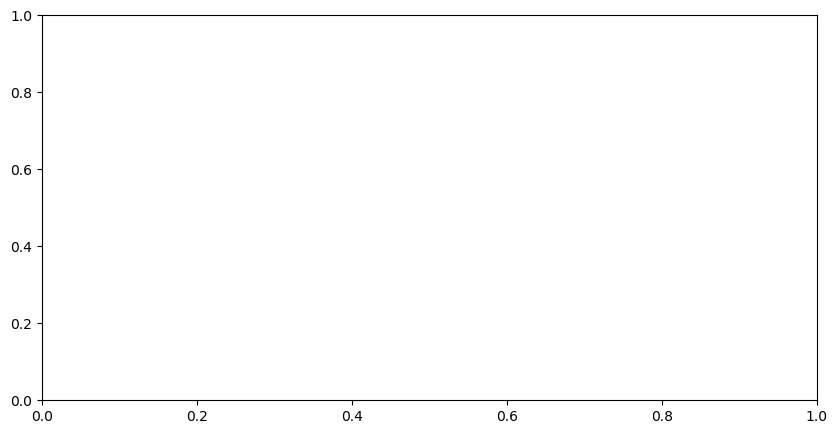

In [431]:
evaluate_model(test_preds, test_target)

In [432]:
feature_importance = pd.DataFrame(data={'features': list(train_features.columns), 'weights': list(lr_model.coef_), 
                                        'bias term': lr_model.intercept_})
feature_importance.sort_values(by='weights', ascending=False, ignore_index=True, inplace=True)

plt.figure(figsize=(10, 10))
plt.title("Feature importances")
plt.barh(feature_importance.head(50)['features'], width=feature_importance.head(50)['weights'],
        color="r", align="center")
plt.show()

ValueError: arrays must all be same length

## Decision Tree<a id="4.3"></a>

In [155]:
for depth in trange(1, 15):
    tree = DecisionTreeRegressor(max_depth=depth, max_features=None)
    tree.fit(train_features, train_target)
    train_preds = tree.predict(train_features)
    valid_preds = tree.predict(valid_features)
    
    print('Depth is {}\n'.format(depth))
    
    print('RMSE on train : {:.2f}\nMAPE on train : {:.2f}'.format(mean_squared_error(train_target, train_preds, squared=False),
                                                            mean_absolute_percentage_error(train_target, train_preds)))    

    print('RMSE on valid : {:.2f}\nMAPE on valid : {:.2f}'.format(mean_squared_error(valid_target, valid_preds, squared=False),
                                                             mean_absolute_percentage_error(valid_target, valid_preds)))
    
    print('\n\n\n')

Depth is 1

RMSE on train : 16733.06
MAPE on train : 5.43
RMSE on valid : 19627.42
MAPE on valid : 5.82




Depth is 2

RMSE on train : 10543.02
MAPE on train : 3.27
RMSE on valid : 12779.51
MAPE on valid : 4.19




Depth is 3

RMSE on train : 7749.81
MAPE on train : 2.41
RMSE on valid : 8927.34
MAPE on valid : 2.85




Depth is 4

RMSE on train : 6315.04
MAPE on train : 1.95
RMSE on valid : 7196.64
MAPE on valid : 2.33




Depth is 5

RMSE on train : 5395.95
MAPE on train : 1.67
RMSE on valid : 6470.84
MAPE on valid : 2.02




Depth is 6

RMSE on train : 4622.55
MAPE on train : 1.40
RMSE on valid : 5636.49
MAPE on valid : 1.64




Depth is 7

RMSE on train : 3984.85
MAPE on train : 1.20
RMSE on valid : 5731.37
MAPE on valid : 1.71




Depth is 8

RMSE on train : 3321.59
MAPE on train : 0.99
RMSE on valid : 5538.07
MAPE on valid : 1.65




Depth is 9

RMSE on train : 2711.82
MAPE on train : 0.77
RMSE on valid : 5641.46
MAPE on valid : 1.70




Depth is 10

RMSE on train : 2187.67
MAPE 

In [433]:
best_tree = DecisionTreeRegressor(max_depth=6, max_features=None, random_state=12345)

In [434]:
test_preds = train_best_model(best_tree, train_features_ext, train_target_ext, test_features, test_target)

RMSE on train : 8432.05
MAPE on train : 2.56
RMSE on test : 8022.43
MAPE on test : 2.58


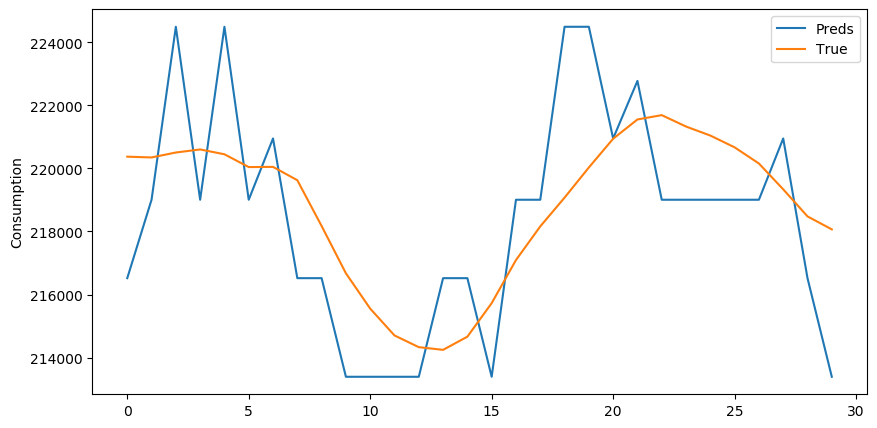

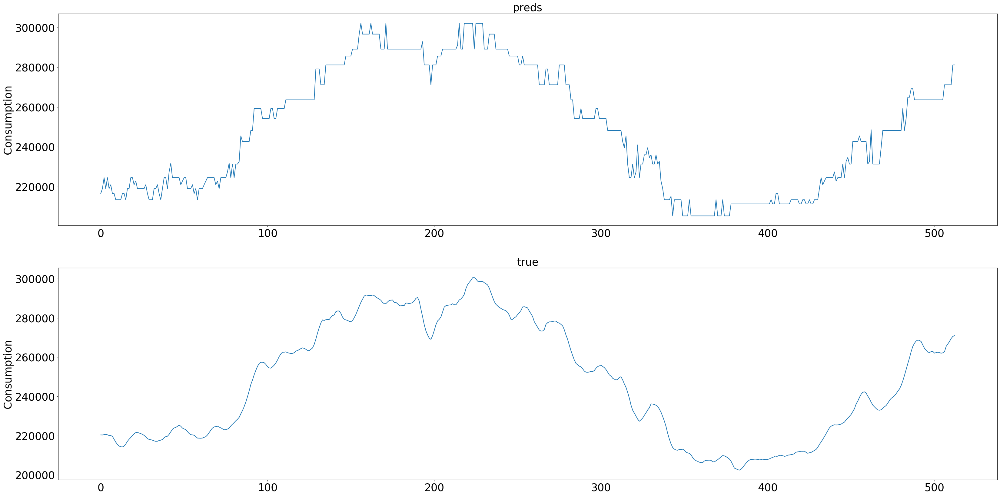

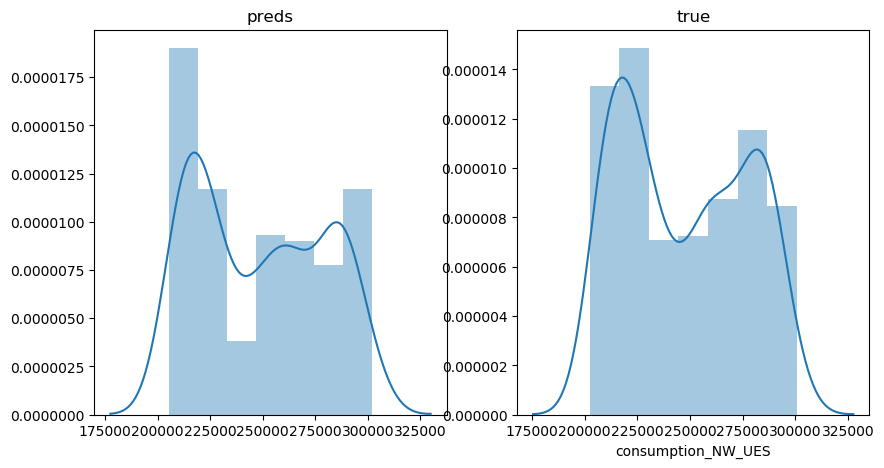

In [159]:
evaluate_model(test_preds, test_target)

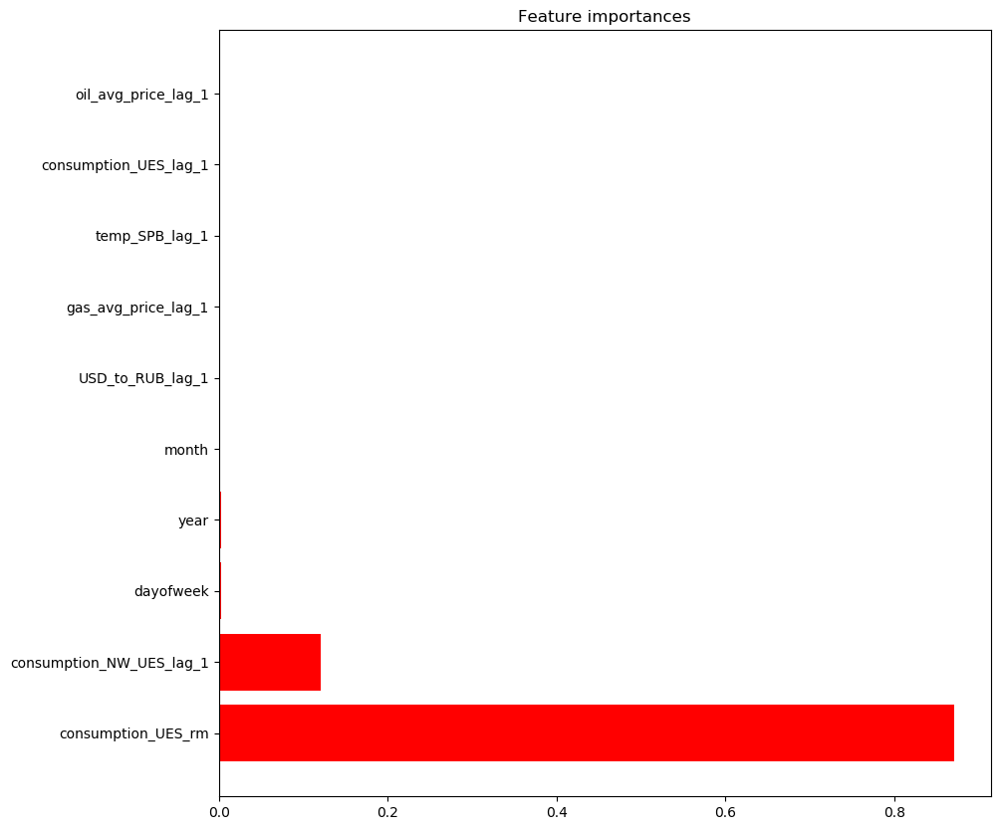

In [160]:
feature_importance = pd.DataFrame(data={'features': list(train_features.columns), 'weights': list(best_tree.feature_importances_)})
feature_importance.sort_values(by='weights', ascending=False, ignore_index=True, inplace=True)

plt.figure(figsize=(10, 10))
plt.title("Feature importances")
plt.barh(feature_importance.head(10)['features'], width=feature_importance.head(10)['weights'],
        color="r", align="center")
plt.show()

## Random Forest<a id="4.4"></a>

In [161]:
best_forest = None
best_error = 100
for estim in trange(10, 151, 10):
    for depth in trange(1, 15):
        forest = RandomForestRegressor(n_estimators=estim, max_depth=depth, max_features=None)
        forest.fit(train_features, train_target)
        valid_preds = forest.predict(valid_features)
        error = mean_absolute_percentage_error(valid_target, valid_preds)
        if error < best_error:
            best_error = error
            best_forest = forest
print('\nDone! The best forest model found.')




Done! The best forest model found.


In [162]:
best_forest

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=14, max_features=None, max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=30, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

In [435]:
best_forest = RandomForestRegressor(n_estimators=30, max_depth=14, max_features=None, random_state=12345)

In [343]:
for lag in range(30):
    train_features, train_target, valid_features, valid_target, test_features, test_target = preprocessing(dataset, 
                                                    max_lag=lag, rolling_mean_size=7, use_forecasts=False, use_generation=False)
    best_forest.fit(train_features, train_target)
    valid_preds = best_forest.predict(valid_features)
    error = mean_absolute_percentage_error(valid_target, valid_preds)
    print('Lag is {}, MAPE is {}'.format(lag, error))

Lag is 0, MAPE is 2.1499288196624193
Lag is 1, MAPE is 1.6306417885571207
Lag is 2, MAPE is 1.7690178129976937
Lag is 3, MAPE is 1.791906283760299
Lag is 4, MAPE is 1.8529579093442046
Lag is 5, MAPE is 1.8991272034262257
Lag is 6, MAPE is 1.8987855084309526
Lag is 7, MAPE is 1.9195375350626962
Lag is 8, MAPE is 1.9376938634850012
Lag is 9, MAPE is 1.9066185334115007
Lag is 10, MAPE is 1.896356988324343
Lag is 11, MAPE is 1.9194432736627405
Lag is 12, MAPE is 1.872212659071312
Lag is 13, MAPE is 1.8538423239595185
Lag is 14, MAPE is 1.8036449559778944
Lag is 15, MAPE is 1.844711468972798
Lag is 16, MAPE is 1.8319600438688317
Lag is 17, MAPE is 1.8394166967625056
Lag is 18, MAPE is 1.8545178205694
Lag is 19, MAPE is 1.8784673158370833
Lag is 20, MAPE is 1.8339015971516321
Lag is 21, MAPE is 1.82857314366107
Lag is 22, MAPE is 1.8293561218093815
Lag is 23, MAPE is 1.8449781991931675
Lag is 24, MAPE is 1.8607569848463246
Lag is 25, MAPE is 1.853256089125578
Lag is 26, MAPE is 1.88187266713

In [436]:
test_preds = train_best_model(best_forest, train_features_ext, train_target_ext, test_features, test_target)

RMSE on train : 2776.03
MAPE on train : 0.78
RMSE on test : 6296.15
MAPE on test : 1.91


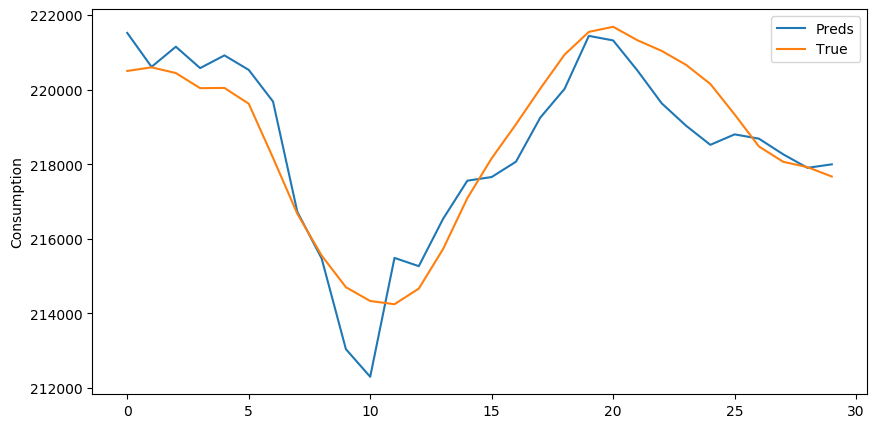

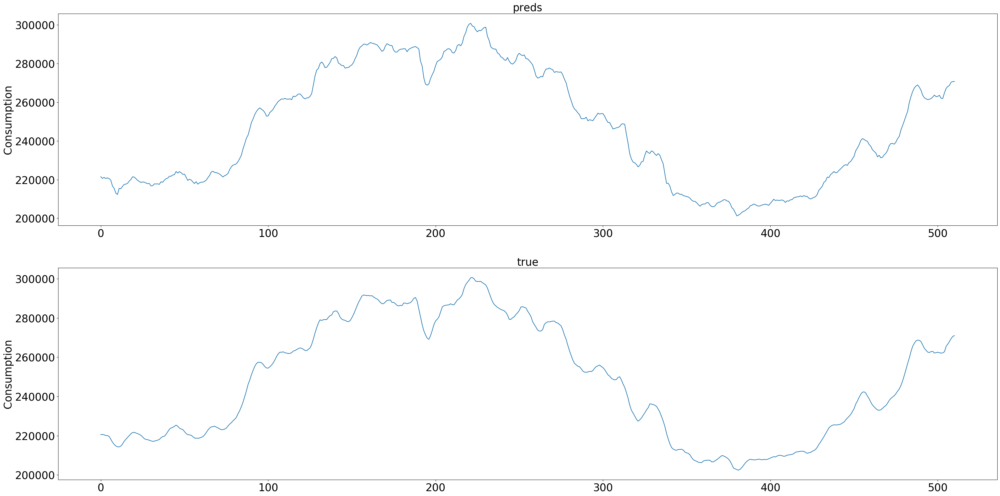

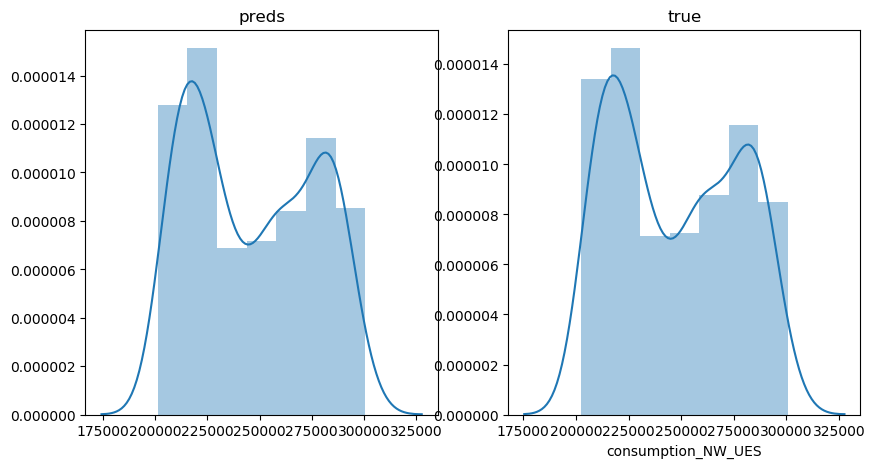

In [324]:
evaluate_model(test_preds, test_target)

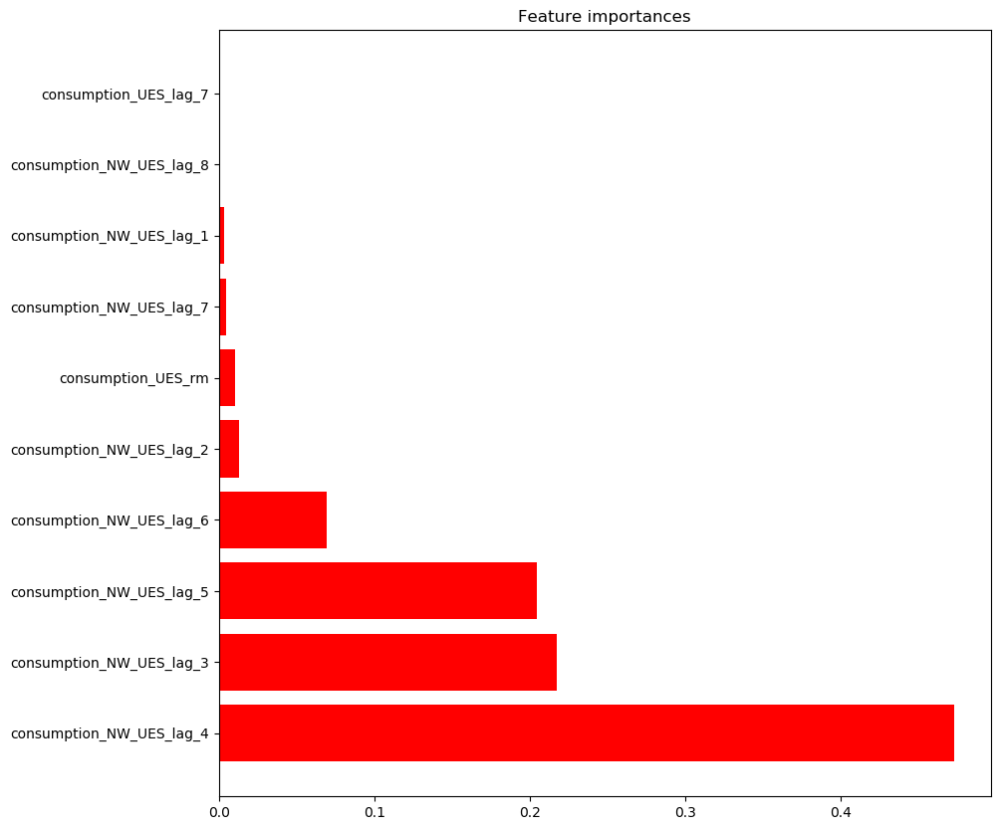

In [325]:
feature_importance = pd.DataFrame(data={'features': list(train_features.columns), 'weights': list(best_forest.feature_importances_)})
feature_importance.sort_values(by='weights', ascending=False, ignore_index=True, inplace=True)

plt.figure(figsize=(10, 10))
plt.title("Feature importances")
plt.barh(feature_importance.head(10)['features'], width=feature_importance.head(10)['weights'],
        color="r", align="center")
plt.show()

## CatBoost from Yandex<a id="4.5"></a>

In [167]:
best_cat = None
best_error = 100
print('Processing...', end='')
for iters in [50, 100, 300, 1000]:
    for lr in [0.0003, 0.03]:
        cat = CatBoostRegressor(loss_function='MAPE', iterations=iters, learning_rate=lr, verbose=0)
        cat.fit(train_features, train_target)
        valid_preds = cat.predict(valid_features)
        error = mean_absolute_percentage_error(valid_target, valid_preds)
        if error < best_error:
            best_error = error
            best_cat = cat
    print('...', end='')
print('\nDone! The best cat model found.')

Processing...............
Done! The best cat model found.


In [168]:
best_cat.get_params()

{'iterations': 1000,
 'learning_rate': 0.03,
 'loss_function': 'MAPE',
 'verbose': 0}

In [327]:
best_cat = CatBoostRegressor(loss_function='MAPE', iterations=1000, learning_rate=0.03, verbose=0, random_state=12345)

In [328]:
test_preds = train_best_model(best_cat, train_features_ext, train_target_ext, test_features, test_target)

RMSE on train : 13416.88
MAPE on train : 3.74
RMSE on test : 9694.64
MAPE on test : 2.63


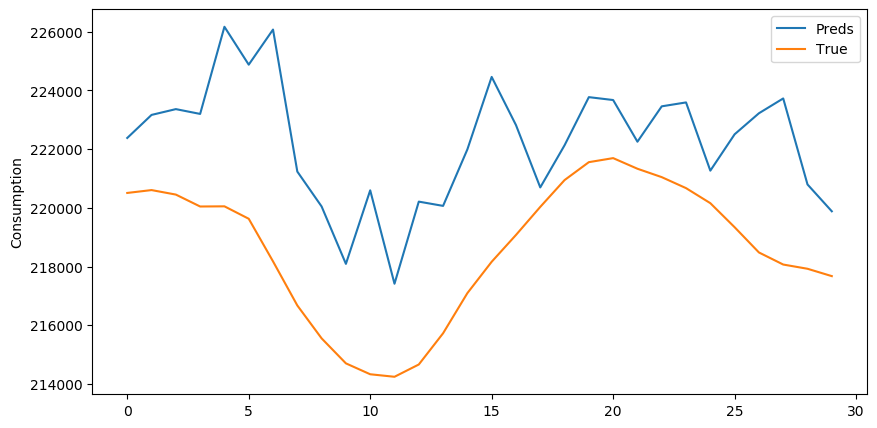

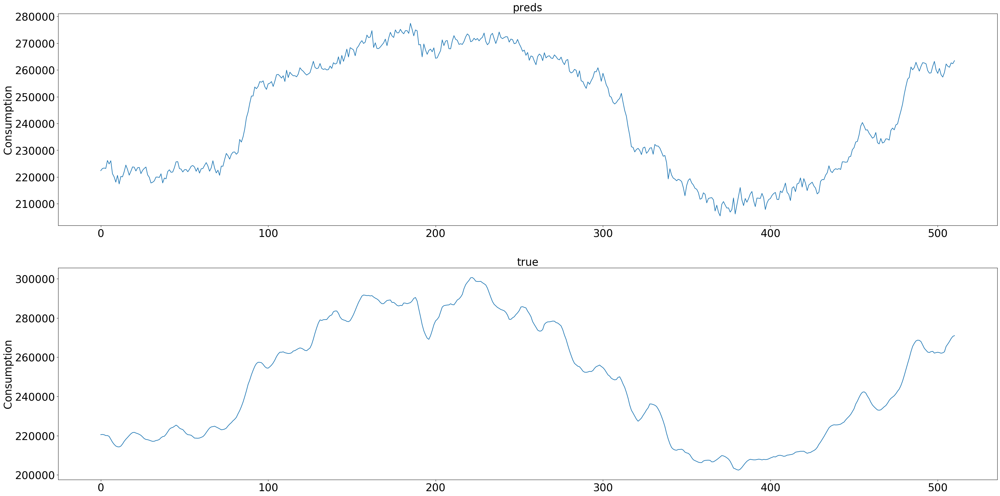

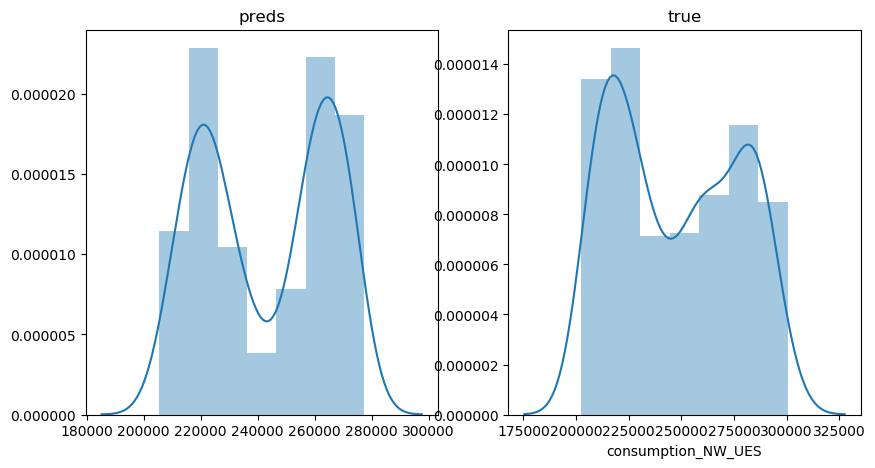

In [329]:
evaluate_model(test_preds, test_target)

## MLP Regressor<a id="4.6"></a>

In [326]:
from sklearn.neural_network import MLPRegressor

mlp = MLPRegressor()
mlp.fit(train_features, train_target)
train_preds = mlp.predict(train_features)
valid_preds = mlp.predict(valid_features)
test_preds = mlp.predict(test_features)
    
print('RMSE on train : {:.2f}\nMAPE on train : {:.2f}'.format(mean_squared_error(train_target, train_preds, squared=False),
                                                            mean_absolute_percentage_error(train_target, train_preds)))    

print('RMSE on valid : {:.2f}\nMAPE on valid : {:.2f}'.format(mean_squared_error(valid_target, valid_preds, squared=False),
                                                             mean_absolute_percentage_error(valid_target, valid_preds)))

print('RMSE on test : {:.2f}\nMAPE on test : {:.2f}'.format(mean_squared_error(test_target, test_preds, squared=False),
                                                             mean_absolute_percentage_error(test_target, test_preds)))

RMSE on train : 10061.25
MAPE on train : 3.16
RMSE on valid : 10475.18
MAPE on valid : 3.22
RMSE on test : 9085.31
MAPE on test : 2.98


## Forecasting for 3 days ahead via Random Forest<a id="4.7"></a>

In [173]:
import warnings
warnings.filterwarnings('ignore')

In [289]:
train_features, train_target, valid_features, valid_target, test_features, test_target = preprocessing(dataset, 
                                                    max_lag=30, rolling_mean_size=7, use_forecasts=False,
                                                    forecasting_period=3)

train_features_ext = pd.concat([train_features, valid_features]) #extended
train_target_ext = pd.concat([train_target, valid_target])

best_forest = RandomForestRegressor(n_estimators=120, max_depth=12, max_features=None, random_state=12345)
test_preds = train_best_model(best_forest, train_features_ext, train_target_ext, test_features, test_target)

RMSE on train : 624.31
MAPE on train : 0.18
RMSE on test : 1411.13
MAPE on test : 0.45


Text(0.5, 0, 'Days')

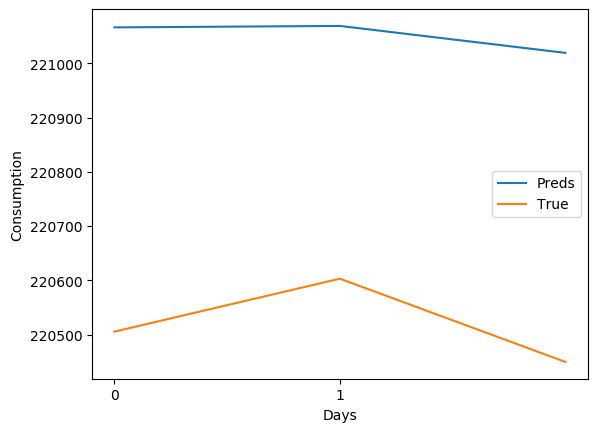

In [290]:
pd.Series(test_preds[0]).plot()
test_target['consumption_NW_UES'][:3].reset_index(drop=True).plot()
plt.ylabel('Consumption')
plt.legend(['Preds', 'True'])
plt.xticks(ticks=range(2))
plt.xlabel('Days')

## Forecasting for a week ahead via Random Forest<a id="4.8"></a>

In [336]:
train_features, train_target, valid_features, valid_target, test_features, test_target = preprocessing(dataset, 
                                                    max_lag=30, rolling_mean_size=7, use_forecasts=False,
                                                    forecasting_period=7)

train_features_ext = pd.concat([train_features, valid_features]) #extended
train_target_ext = pd.concat([train_target, valid_target])

best_forest = RandomForestRegressor(n_estimators=120, max_depth=12, max_features=None, random_state=12345)
test_preds = train_best_model(best_forest, train_features_ext, train_target_ext, test_features, test_target)

RMSE on train : 1197.11
MAPE on train : 0.33
RMSE on test : 2792.00
MAPE on test : 0.79


In [57]:
best_forest = RandomForestRegressor(n_estimators=120, max_depth=12, max_features=None, random_state=12345)
test_preds = train_best_model(best_forest, train_features_ext, train_target_ext, test_features, test_target)

RMSE on train : 3035.16
MAPE on train : 0.87
RMSE on test : 6215.45
MAPE on test : 1.88


Text(0.5, 0, 'Days')

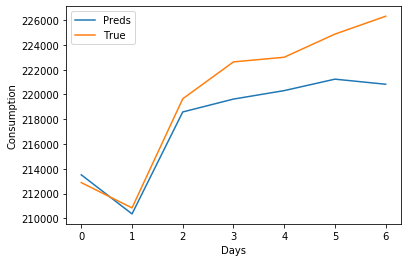

In [58]:
pd.Series(test_preds[0]).plot()
test_target['consumption_NW_UES'][:7].reset_index(drop=True).plot()
plt.ylabel('Consumption')
plt.legend(['Preds', 'True'])
plt.xticks(ticks=range(7))
plt.xlabel('Days')

In [59]:
from joblib import dump, load
dump(best_forest, 'forest.joblib') 

['forest.joblib']

In [148]:
model = load('forest.joblib')

In [149]:
test_preds = model.predict(test_features)
print('RMSE on test : {:.2f}\nMAPE on test : {:.2f}'.format(mean_squared_error(test_target, test_preds, 
                                                squared=False), mean_absolute_percentage_error(test_target, test_preds)))

RMSE on test : 6215.45
MAPE on test : 1.88


In [192]:
features.tail(10)

,consumption_UES_lag_1,consumption_UES_lag_2,consumption_UES_lag_3,consumption_UES_lag_4,consumption_UES_lag_5,consumption_UES_lag_6,consumption_UES_lag_7,consumption_UES_lag_8,consumption_UES_lag_9,consumption_UES_lag_10,...,oil_avg_price_lag_27,oil_avg_price_lag_28,oil_avg_price_lag_29,oil_avg_price_lag_30,year,month,day,dayofweek,consumption_UES_rm,consumption_NW_rm
date,,,,,,,,,,,,,,,,,,,,,
2020-11-18,3172629.0,3141699.0,3002710.0,3014307.0,3071123.0,3055647.0,3038799.0,3010250.0,2987249.0,2866030.0,...,42.020000,42.32,42.80,42.66,2020,11,18,2,3.070988e+06,271813.571429
2020-11-19,3201471.0,3172629.0,3141699.0,3002710.0,3014307.0,3071123.0,3055647.0,3038799.0,3010250.0,2987249.0,...,42.080000,42.02,42.32,42.80,2020,11,19,3,3.094227e+06,272267.857143
2020-11-20,3195763.0,3201471.0,3172629.0,3141699.0,3002710.0,3014307.0,3071123.0,3055647.0,3038799.0,3010250.0,...,41.720000,42.08,42.02,42.32,2020,11,20,4,3.114243e+06,272011.285714
2020-11-21,3191706.0,3195763.0,3201471.0,3172629.0,3141699.0,3002710.0,3014307.0,3071123.0,3055647.0,3038799.0,...,41.360000,41.72,42.08,42.02,2020,11,21,5,3.131469e+06,272015.714286
2020-11-22,3093792.0,3191706.0,3195763.0,3201471.0,3172629.0,3141699.0,3002710.0,3014307.0,3071123.0,3055647.0,...,41.000000,41.36,41.72,42.08,2020,11,22,6,3.142824e+06,272385.428571
2020-11-23,3064108.0,3093792.0,3191706.0,3195763.0,3201471.0,3172629.0,3141699.0,3002710.0,3014307.0,3071123.0,...,40.850000,41.00,41.36,41.72,2020,11,23,0,3.151595e+06,273029.285714
2020-11-24,3174324.0,3064108.0,3093792.0,3191706.0,3195763.0,3201471.0,3172629.0,3141699.0,3002710.0,3014307.0,...,39.860000,40.85,41.00,41.36,2020,11,24,1,3.156256e+06,273161.285714
2020-11-25,3165232.0,3174324.0,3064108.0,3093792.0,3191706.0,3195763.0,3201471.0,3172629.0,3141699.0,3002710.0,...,38.400000,39.86,40.85,41.00,2020,11,25,2,3.155199e+06,273348.142857
2020-11-26,3172048.0,3165232.0,3174324.0,3064108.0,3093792.0,3191706.0,3195763.0,3201471.0,3172629.0,3141699.0,...,37.480000,38.40,39.86,40.85,2020,11,26,3,3.150996e+06,273744.142857


In [193]:
model.predict(features.iloc[-1:])

array([[279127.27310425, 274695.29584653, 274819.88053112,
        282300.29568923, 284263.32876838, 284780.17521427,
        285852.10144971]])

In [198]:
preds = pd.Series(model.predict(features.iloc[-1:])[0], index = pd.date_range('2020-11-27', '2020-12-03'))
preds.iloc[0] = 281354.0
preds

2020-11-27    281354.000000
2020-11-28    274695.295847
2020-11-29    274819.880531
2020-11-30    282300.295689
2020-12-01    284263.328768
2020-12-02    284780.175214
2020-12-03    285852.101450
Freq: D, dtype: float64

In [199]:
dataset.iloc[-7:, 0]

date
2020-11-21    269451.0
2020-11-22    268178.0
2020-11-23    275349.0
2020-11-24    277892.0
2020-11-25    280896.0
2020-11-26    283611.0
2020-11-27    281354.0
Name: consumption_NW_UES, dtype: float64

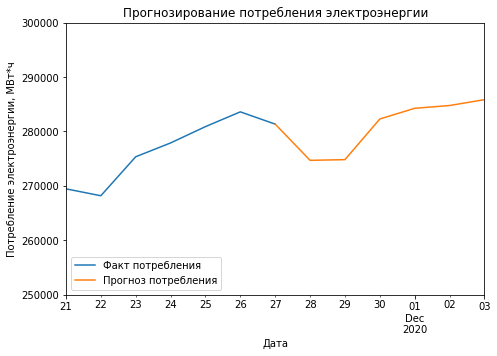

In [207]:
fig = plt.figure(figsize=(7.5, 5))
dataset.iloc[-7:, 0].plot()
preds.plot()
plt.ylim(250000, 300000)
plt.xlabel('Дата')
plt.ylabel('Потребление электроэнергии, МВт*ч')
plt.legend(['Факт потребления', 'Прогноз потребления'], loc='lower left')
plt.title('Прогнозирование потребления электроэнергии')
plt.show()

## Forecasting for a month ahead via Random Forest<a id="4.9"></a>

In [180]:
train_features, train_target, valid_features, valid_target, test_features, test_target = preprocessing(dataset, 
                                                    max_lag=30, rolling_mean_size=7, use_forecasts=False,
                                                    forecasting_period=30)

train_features_ext = pd.concat([train_features, valid_features]) #extended
train_target_ext = pd.concat([train_target, valid_target])

best_forest = RandomForestRegressor(n_estimators=120, max_depth=12, max_features=None, random_state=12345)
test_preds = train_best_model(best_forest, train_features_ext, train_target_ext, test_features, test_target)

RMSE on train : 2314.32
MAPE on train : 0.61
RMSE on test : 7680.42
MAPE on test : 2.35


Text(0.5, 0, 'Days')

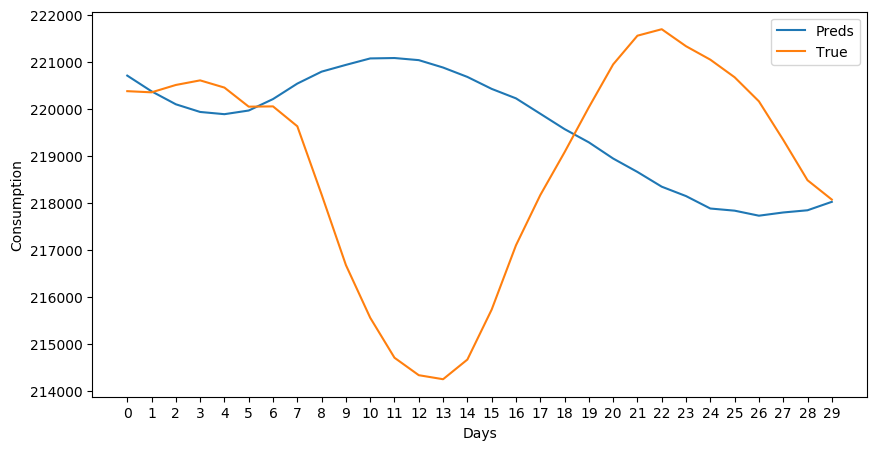

In [181]:
plt.figure(figsize=(10, 5))
pd.Series(test_preds[0]).plot()
test_target['consumption_NW_UES'][:30].reset_index(drop=True).plot()
plt.ylabel('Consumption')
plt.legend(['Preds', 'True'])
plt.xticks(ticks=range(30))
plt.xlabel('Days')

## Forecasting for an year ahead via Random Forest (EXPERIMENTAL)

In [182]:
train_features, train_target, valid_features, valid_target, test_features, test_target = preprocessing(dataset, 
                                                    max_lag=30, rolling_mean_size=7, use_forecasts=False,
                                                    forecasting_period=365)

train_features_ext = pd.concat([train_features, valid_features]) #extended
train_target_ext = pd.concat([train_target, valid_target])

best_forest = RandomForestRegressor(n_estimators=120, max_depth=12, max_features=None, random_state=12345)
test_preds = train_best_model(best_forest, train_features_ext, train_target_ext, test_features, test_target)

RMSE on train : 1197.82
MAPE on train : 0.30
RMSE on test : 8457.46
MAPE on test : 2.79


## Roadmap<a id="5"></a>

1. PROPHET from Facebook: https://facebook.github.io/prophet/
2. SARIMA/SARIMAX: https://www.statsmodels.org/dev/examples/notebooks/generated/statespace_sarimax_stata.html
3. DeepAR+ from Amazon Research: https://arxiv.org/abs/1704.04110, https://docs.aws.amazon.com/forecast/latest/dg/aws-forecast-recipe-deeparplus.html
4. Temporal Fusion Transformer from Oxford and Google Cloud AI Team: https://arxiv.org/abs/1912.09363, https://pytorch-forecasting.readthedocs.io/en/latest/tutorials/stallion.html